### Inspired from

https://mlarchive.com/deep-learning/variational-autoencoders-a-vanilla-implementation/

https://towardsdatascience.com/conditional-variational-autoencoders-for-text-to-image-generation-1996da9cefcb

https://www.kaggle.com/code/asheniranga/variational-autoencoder-with-pytorch

#### Training logs

https://wandb.ai/ahmadjaved97/assignment-5-v2

### Import required libraries

In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import transforms
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader, random_split
from torch.optim.lr_scheduler import StepLR
from torchvision.utils import save_image
from torchvision.utils import make_grid
from torchmetrics.image.fid import FrechetInceptionDistance
import numpy as np
import matplotlib.pyplot as plt
import os
from PIL import Image
import random
from tqdm import tqdm
from sklearn.metrics import confusion_matrix
from sklearn.manifold import TSNE
import seaborn as sns
import wandb

### Set Device

In [2]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Device Used: {device}")

Device Used: cuda


In [3]:
saved_model_folder = "./saved_models"
os.makedirs(saved_model_folder, exist_ok=True)

### Data Loading and Processing

In [4]:
class AFHQDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        """
        root_dir: path of the parent directory that contains images.
        transforms: augmentations applied to the images (can be none or more).
        """
        self.root_dir = root_dir
        self.transform = transform
        self.image_paths = []
        self.labels = []
        self.class_mapping = {}
        
        extensions = (".jpg", ".jpeg", ".png")
        # go through all sub-directories
        for label, category in enumerate(sorted(os.listdir(root_dir))):
            full_path = os.path.join(root_dir, category)
            if os.path.exists(full_path):
                self.class_mapping[label] = category
                for img_name in os.listdir(full_path):
                    if img_name.endswith(extensions):
                        self.image_paths.append(os.path.join(full_path, img_name))
                        self.labels.append(label)

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        img_path = self.image_paths[idx]
        image = Image.open(img_path).convert('RGB')
        label = self.labels[idx]
        
        if self.transform:
            image = self.transform(image)
        
        return image, label

In [5]:
# Dataset Hyperparameters
img_size = 64
batch_size = 64

# dataset paths
train_dir = '/home/user/javeda1/stargan-v2/data/afhq/train'
val_dir = '/home/user/javeda1/stargan-v2/data/afhq/val'

### Define augmentations

In [6]:
transform = transforms.Compose([
    
        # transforms.GaussianBlur(3, sigma=(0.1, 2.0)),
        transforms.Resize((img_size, img_size)), # image is downsampled to 64x64
        transforms.ToTensor(),
        transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
    ])

In [7]:
# Load the train and val dataset
train_dataset = AFHQDataset(root_dir=train_dir, transform=transform)
val_dataset = AFHQDataset(root_dir=val_dir, transform=transform)

# DataLoaders for train and val sets
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=4)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=4)

train_size = len(train_loader.dataset)
val_size = len(val_loader.dataset)

print(f"Train dataset size: {train_size}")
print(f"Validation dataset size: {val_size}")

Train dataset size: 14630
Validation dataset size: 1500


### Visualize Dataset

In [8]:
def visualize_dataset(dataloader, num_images=12):
    """
    Visualizes a given number of images from the given data loader.
    """
    data_iter = iter(dataloader)
    images, labels = next(data_iter)
    class_mapping = dataloader.dataset.class_mapping
    
    # creates a suitable grid
    # grid_size = int(np.ceil(np.sqrt(num_images)))
    num_rows = int(np.sqrt(num_images))
    num_cols = int(np.ceil(num_images / num_rows))
    # print(num_cols, num_rows)
    plt.figure(figsize=(6, 6))
    plt.suptitle("Sample images from AFHQ dataset")
    
    for idx in range(min(num_images, len(images))):
        plt.subplot(num_rows, num_cols, idx + 1)
        
        img = images[idx].permute(1, 2, 0).numpy()
        max_val = np.max(img)
        min_val = np.min(img)
        img = (img - min_val) / (max_val - min_val)
        
        plt.imshow(img)
        plt.title(f'Class: {class_mapping[labels[idx].item()]}')
        plt.axis('off')
    
    plt.tight_layout()
    plt.show()

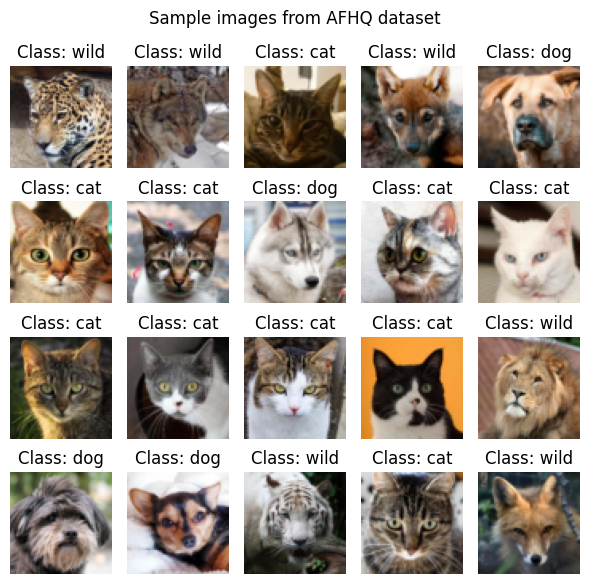

In [9]:
visualize_dataset(train_loader, num_images=20)

### Training and Validation Code

In [10]:
def vae_loss_function(recon_x, x, mu, log_var, kl_weight=1):
    """
    Calculates the VAE loss as a combination of 
    reconstruction loss and KL divergence, 
    scaled by a weight.
    """
    recon_loss = F.mse_loss(recon_x, x, reduction='sum')
    kl_divergence = -0.5 * torch.sum(1 + log_var - mu.pow(2) - log_var.exp())
    return recon_loss + kl_divergence * kl_weight, recon_loss, kl_divergence

def train_vae(model, train_loader, optimizer, kl_weight, device):
    """
    Trains the Variational Autoencoder (VAE) for one epoch on the given training data loader.
    """
    model.train()
    running_loss = 0.0
    running_recon_loss = 0.0
    running_kl_loss = 0.0
    
    for inputs, _ in train_loader:  #labels not used
        inputs = inputs.to(device)
        optimizer.zero_grad()
        recon_x, mu, log_var = model(inputs)
        loss, recon_loss, kl_loss = vae_loss_function(recon_x, inputs, mu, log_var, kl_weight)
        loss.backward()
        optimizer.step()
        
        # Collect all losses
        running_loss += loss.item()
        running_recon_loss += recon_loss.item()
        running_kl_loss += kl_loss.item()
        
    dataset_size = len(train_loader.dataset)
    return {
        'total_loss': running_loss / dataset_size,
        'recon_loss': running_recon_loss / dataset_size,
        'kl_loss': running_kl_loss / dataset_size
    }

def evaluate_vae(model, val_loader, kl_weight, device):
    """
    Evaluates the Variational Autoencoder (VAE) on the validation dataset after each epoch.
    """
    model.eval()
    running_loss = 0.0
    running_recon_loss = 0.0
    running_kl_loss = 0.0
    
    with torch.no_grad():
        for inputs, _ in val_loader:
            inputs = inputs.to(device)
            recon_x, mu, log_var = model(inputs)
            loss, recon_loss, kl_loss = vae_loss_function(recon_x, inputs, mu, log_var, kl_weight)
            
            # Collect all losses
            running_loss += loss.item()
            running_recon_loss += recon_loss.item()
            running_kl_loss += kl_loss.item()
            
    dataset_size = len(val_loader.dataset)
    return {
        'total_loss': running_loss / dataset_size,
        'recon_loss': running_recon_loss / dataset_size,
        'kl_loss': running_kl_loss / dataset_size
    }

def run_vae_training(
    model, train_loader, val_loader, device, num_epochs, learning_rate=0.001, 
    project="vae-training", name="vae_run", kl_weight=0.1, step_size=30, gamma=0.1):

    """Train and evaluate the model for a given number of epochs with W&B logging"""

    print(f"Training Name: {name}")
    print(f"Total num. of Epochs: {num_epochs}")
    print(f"Learning Rate: {learning_rate}")
    print(f"KL Weight used for Loss function: {kl_weight}\n")
    
    # Sample a batch for visualization ( used here to make it same for every epoch)
    inputs, _ = next(iter(train_loader))
    inputs = inputs.to(device)
    
    # Initialize W&B logging
    wandb.init(project=project, name=name, 
               config={
                   "learning_rate": learning_rate,
                   "num_epochs": num_epochs,
                   "step_size": step_size,
                   "gamma": gamma,
                   "kl_weight": kl_weight
               })
    
    optimizer = optim.Adam(model.parameters(), lr=learning_rate, weight_decay=1e-5) # Optimizer
    scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=step_size, gamma=gamma)  # Learning rate scheduler
    
    for epoch in tqdm(range(num_epochs)):
        # Train for one epoch
        train_metrics = train_vae(model, train_loader, optimizer, kl_weight, device)
        # Evaluate after each epoch
        val_metrics = evaluate_vae(model, val_loader, kl_weight, device)
        
        current_lr = scheduler.get_last_lr()[0]
        scheduler.step()

        # Log images to W&B
        with torch.no_grad():
            # # Sample a small batch for visualization
            # inputs, _ = next(iter(train_loader))
            # inputs = inputs[:32].to(device)
            recon_x, _, _ = model(inputs)

            # Normalize and convert to image format
            recon_x = recon_x.view(-1, *inputs.shape[1:])
            recon_grid = make_grid(recon_x.cpu().detach() * 0.5 + 0.5, normalize=True, pad_value=1, padding=10)
            original_grid = make_grid(inputs.cpu().detach() * 0.5 + 0.5, normalize=True, pad_value=1, padding=10)
    
        # Log all data to W&B
        wandb.log({
            "epoch": epoch + 1,
            "train/total_loss": train_metrics['total_loss'],
            "train/recon_loss": train_metrics['recon_loss'],
            "train/kl_loss": train_metrics['kl_loss'],
            "val/total_loss": val_metrics['total_loss'],
            "val/recon_loss": val_metrics['recon_loss'],
            "val/kl_loss": val_metrics['kl_loss'],
            "learning_rate": current_lr,
            "original_images": wandb.Image(original_grid),
            "reconstructed_images": wandb.Image(recon_grid),
        })
        
        # # Print stats after each epoch
        print(f"\nEpoch {epoch+1}/{num_epochs}")
        print(f"Learning Rate: {current_lr:.6f}")
        print(f"Train - Total: {train_metrics['total_loss']:.4f}, "
              f"Recon: {train_metrics['recon_loss']:.4f}, "
              f"KL: {train_metrics['kl_loss']:.4f}")
        print(f"Eval  - Total: {val_metrics['total_loss']:.4f}, "
              f"Recon: {val_metrics['recon_loss']:.4f}, "
              f"KL: {val_metrics['kl_loss']:.4f}")
    
    # End W&B run
    wandb.finish()
    
    return model

### FID Score

In [11]:
def compute_fid_score(model, data_loader, device, max_samples=1000):
    """
    Computes the Fréchet Inception Distance (FID) between real and generated data.
    Taken from : https://lightning.ai/docs/torchmetrics/stable/image/frechet_inception_distance.html
    """
    fid = FrechetInceptionDistance(feature=2048).to(device)  # Use InceptionV3(default) features
    model.eval()
    
    total_samples = 0
    with torch.no_grad():
        for inputs, _ in data_loader:
            inputs = inputs.to(device)

            # Generate reconstructions
            recon_x, _, _ = model(inputs)

            # Convert images to uint8 and scale to [0, 255]
            inputs = (inputs * 255).byte()  
            recon_x = (recon_x * 255).byte()

            fid.update(inputs, real=True)
            fid.update(recon_x, real=False)

            total_samples += inputs.size(0)
    
    # Compute the FID score
    fid_score = fid.compute().item()
    return fid_score

#### Load saved model

In [12]:
def load_model(model_path):
    """
    Load a saved model
    """
    model = torch.load(model_path)
    return model

### Result visualizations

In [13]:
def visualize_reconstructions(model, images, device, num_images=8):
    """Visualizes original and reconstructed images from the VAE"""
    model.eval()
    
    images = images[:num_images].to(device)
    
    with torch.no_grad():
        recon_images, _, _ = model(images)
    
    # Move to CPU and convert to numpy
    images = images.cpu().permute(0, 2, 3, 1).numpy()
    recon_images = recon_images.cpu().permute(0, 2, 3, 1).numpy()
    
    # min-max normalization
    images = np.array([(img - np.min(img))/(np.max(img) - np.min(img)) for img in images])
    recon_images = np.array([(img - np.min(img))/(np.max(img) - np.min(img)) for img in recon_images])
    
    plt.figure(figsize=(num_images * 2, 4))
    for i in range(num_images):
        plt.subplot(2, num_images, i + 1)
        plt.imshow(images[i])
        plt.axis("off")
        plt.title("Original")
        
        plt.subplot(2, num_images, i + 1 + num_images)
        plt.imshow(recon_images[i])
        plt.axis("off")
        plt.title("Reconstructed")
        
    plt.suptitle("Original vs Reconstructed Images", fontsize=16)
    plt.tight_layout()
    plt.show()

### Model Architecture

In [14]:
class VAEEncoder(nn.Module):
    def __init__(self, latent_dim):
        super(VAEEncoder, self).__init__()
        
        # Initial convolution
        self.conv_initial = nn.Conv2d(3, 64, 3, stride=1, padding=1)
        
        # Downsampling blocks
        self.conv1 = nn.Conv2d(64, 128, 4, stride=2, padding=1)    
        self.conv2 = nn.Conv2d(128, 256, 4, stride=2, padding=1)   
        self.conv3 = nn.Conv2d(256, 512, 4, stride=2, padding=1)   
        self.conv4 = nn.Conv2d(512, 1024, 4, stride=2, padding=1)
        
        # Batch normalization
        self.bn1 = nn.BatchNorm2d(128)
        self.bn2 = nn.BatchNorm2d(256)
        self.bn3 = nn.BatchNorm2d(512)
        self.bn4 = nn.BatchNorm2d(1024)
        
        
        # Bottleneck
        self.fc_mu = nn.Linear(1024 * 4 * 4, latent_dim)
        self.fc_var = nn.Linear(1024 * 4 * 4, latent_dim)
        
        # Dropout for regularization
        self.dropout = nn.Dropout(0.2)
        
    def forward(self, x):
        # # Ensure input is 4D: [batch_size, channels, height, width]
        # if x.dim() == 3:
        #     x = x.unsqueeze(0)  # Add batch dimension if missing
        # elif x.dim() != 4:
        #     raise ValueError(f"Expected 3D or 4D input (got {x.dim()}D input)")
            
        # # Check channels dimension
        # if x.size(1) != 3:
        #     raise ValueError(f"Expected 3 channels (got {x.size(1)} channels)")
            
        # Initial convolution
        x = F.leaky_relu(self.conv_initial(x), 0.2)
        
        # Downsampling path
        x = F.leaky_relu(self.bn1(self.conv1(x)), 0.2)
        x = F.leaky_relu(self.bn2(self.conv2(x)), 0.2)
        x = F.leaky_relu(self.bn3(self.conv3(x)), 0.2)
        x = F.leaky_relu(self.bn4(self.conv4(x)), 0.2)
        
        
        # Flatten and apply dropout
        x = self.dropout(x.view(x.size(0), -1))
        
        # Generate latent parameters
        mu = self.fc_mu(x)
        log_var = self.fc_var(x)
        
        return mu, log_var

class VAEDecoder(nn.Module):
    def __init__(self, latent_dim):
        super(VAEDecoder, self).__init__()
        
        # Initial fully connected layer
        self.fc = nn.Linear(latent_dim, 1024 * 4 * 4)
        
        # Upsampling blocks
        self.conv1 = nn.ConvTranspose2d(1024, 512, 4, stride=2, padding=1) 
        self.conv2 = nn.ConvTranspose2d(512, 256, 4, stride=2, padding=1)  
        self.conv3 = nn.ConvTranspose2d(256, 128, 4, stride=2, padding=1)  
        self.conv4 = nn.ConvTranspose2d(128, 64, 4, stride=2, padding=1)   
        
        # Batch normalization
        # self.bna = nn.BatchNorm2d(1024)
        
        self.bn1 = nn.BatchNorm2d(512)
        self.bn2 = nn.BatchNorm2d(256)
        self.bn3 = nn.BatchNorm2d(128)
        self.bn4 = nn.BatchNorm2d(64)
        
        self.conv_final = nn.Conv2d(64, 3, 3, stride=1, padding=1)
        
        # Dropout
        self.dropout = nn.Dropout(0.2)
        
    def forward(self, x):
        # Reshape from latent space
        x = F.relu(self.fc(x))
        x = x.view(x.size(0), 1024, 4, 4)
        
        # Upsampling path
        x = F.relu(self.bn1(self.conv1(x)))
        x = F.relu(self.bn2(self.conv2(x)))
        x = F.relu(self.bn3(self.conv3(x)))
        x = F.relu(self.bn4(self.conv4(x)))
        
        # Final convolution with tanh activation
        x = torch.tanh(self.conv_final(x))
        
        return x

class ConvVAE(nn.Module):
    def __init__(self, latent_dim):
        super(ConvVAE, self).__init__()
        self.encoder = VAEEncoder(latent_dim)
        self.decoder = VAEDecoder(latent_dim)
        
    def reparameterize(self, mu, log_var):
        if self.training:
            std = torch.exp(0.5 * log_var)
            eps = torch.randn_like(std)
            return mu + eps * std
        return mu
        
    def forward(self, x):
        mu, log_var = self.encoder(x)
        z = self.reparameterize(mu, log_var)
        return self.decoder(z), mu, log_var

### Model training

Seven models were trained with the following kl divergence weights = 1, 1.5, 2,5, 10, 0.01, 0.001, 0.1.

The latent dimensions and num of epochs were fixed at 512 and 40 respectively.

All other parameters were same for each of the models

#### <font color='red'>1. Model with kl_weight=1</font>

In [16]:
# Model training parameters
learning_rate=0.0001
step_size=10
gamma=0.5

kl_weight=1

num_epochs=40

latent_dim = 512 # define latent dimension

name=f"run_kl_wgt_{str(kl_weight)}_ep_{num_epochs}_latent_dim_{latent_dim}"
project="assignment-5-v2"


# Load model
model = ConvVAE(latent_dim=latent_dim).to(device)
# model

model = run_vae_training(
    model, train_loader, val_loader, device, 
    num_epochs=num_epochs, learning_rate=learning_rate,
    step_size=step_size, gamma=gamma,
    kl_weight=kl_weight,
    name=name, project=project
)

save_path = os.path.join(saved_model_folder, name)
torch.save(model, save_path)
print(f"Model saved at: ")

Training Name: run_kl_wgt_1_ep_40_latent_dim_512
Total num. of Epochs: 40
Learning Rate: 0.0001
KL Weight used for Loss function: 1



wandb: Using wandb-core as the SDK backend.  Please refer to https://wandb.me/wandb-core for more information.
wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter, or press ctrl+c to quit:

  ········


wandb: Appending key for api.wandb.ai to your netrc file: /home/user/javeda1/.netrc


  2%|█▍                                                      | 1/40 [00:10<06:36, 10.17s/it]


Epoch 1/40
Learning Rate: 0.000100
Train - Total: 1653.9196, Recon: 1500.0610, KL: 153.8587
Eval  - Total: 1645.1742, Recon: 1485.3813, KL: 159.7929


  5%|██▊                                                     | 2/40 [00:19<06:02,  9.53s/it]


Epoch 2/40
Learning Rate: 0.000100
Train - Total: 1093.1337, Recon: 921.2636, KL: 171.8701
Eval  - Total: 1065.1776, Recon: 879.4257, KL: 185.7518


  8%|████▏                                                   | 3/40 [00:28<05:46,  9.38s/it]


Epoch 3/40
Learning Rate: 0.000100
Train - Total: 968.1743, Recon: 780.8183, KL: 187.3559
Eval  - Total: 887.5771, Recon: 703.6158, KL: 183.9613


 10%|█████▌                                                  | 4/40 [00:37<05:35,  9.32s/it]


Epoch 4/40
Learning Rate: 0.000100
Train - Total: 908.4708, Recon: 718.6686, KL: 189.8022
Eval  - Total: 813.6618, Recon: 624.8188, KL: 188.8430


 12%|███████                                                 | 5/40 [00:46<05:25,  9.31s/it]


Epoch 5/40
Learning Rate: 0.000100
Train - Total: 862.9005, Recon: 675.2609, KL: 187.6396
Eval  - Total: 851.8847, Recon: 673.3741, KL: 178.5105


 15%|████████▍                                               | 6/40 [00:56<05:15,  9.28s/it]


Epoch 6/40
Learning Rate: 0.000100
Train - Total: 829.1888, Recon: 643.6384, KL: 185.5504
Eval  - Total: 752.7120, Recon: 576.2840, KL: 176.4281


 18%|█████████▊                                              | 7/40 [01:05<05:04,  9.24s/it]


Epoch 7/40
Learning Rate: 0.000100
Train - Total: 807.0302, Recon: 624.0948, KL: 182.9354
Eval  - Total: 722.1514, Recon: 540.3459, KL: 181.8055


 20%|███████████▏                                            | 8/40 [01:15<05:04,  9.52s/it]


Epoch 8/40
Learning Rate: 0.000100
Train - Total: 785.9199, Recon: 604.7940, KL: 181.1260
Eval  - Total: 718.4874, Recon: 539.6534, KL: 178.8339


 22%|████████████▌                                           | 9/40 [01:25<04:59,  9.67s/it]


Epoch 9/40
Learning Rate: 0.000100
Train - Total: 763.4780, Recon: 585.3034, KL: 178.1746
Eval  - Total: 691.8582, Recon: 519.7132, KL: 172.1450


 25%|█████████████▊                                         | 10/40 [01:34<04:47,  9.58s/it]


Epoch 10/40
Learning Rate: 0.000100
Train - Total: 745.5709, Recon: 569.3810, KL: 176.1899
Eval  - Total: 690.0282, Recon: 516.4408, KL: 173.5874


 28%|███████████████▏                                       | 11/40 [01:45<04:43,  9.77s/it]


Epoch 11/40
Learning Rate: 0.000050
Train - Total: 714.1313, Recon: 541.8401, KL: 172.2912
Eval  - Total: 674.9987, Recon: 509.3322, KL: 165.6665


 30%|████████████████▌                                      | 12/40 [01:55<04:39,  9.97s/it]


Epoch 12/40
Learning Rate: 0.000050
Train - Total: 705.2010, Recon: 533.7253, KL: 171.4757
Eval  - Total: 665.0065, Recon: 491.4441, KL: 173.5624


 32%|█████████████████▉                                     | 13/40 [02:05<04:27,  9.90s/it]


Epoch 13/40
Learning Rate: 0.000050
Train - Total: 696.8852, Recon: 525.5069, KL: 171.3783
Eval  - Total: 682.3747, Recon: 519.5713, KL: 162.8035


 35%|███████████████████▎                                   | 14/40 [02:14<04:16,  9.86s/it]


Epoch 14/40
Learning Rate: 0.000050
Train - Total: 691.7272, Recon: 520.3789, KL: 171.3483
Eval  - Total: 637.5154, Recon: 469.0558, KL: 168.4595


 38%|████████████████████▋                                  | 15/40 [02:25<04:11, 10.07s/it]


Epoch 15/40
Learning Rate: 0.000050
Train - Total: 685.6159, Recon: 514.0502, KL: 171.5657
Eval  - Total: 623.7462, Recon: 454.6467, KL: 169.0994


 40%|██████████████████████                                 | 16/40 [02:37<04:15, 10.63s/it]


Epoch 16/40
Learning Rate: 0.000050
Train - Total: 679.4629, Recon: 508.2217, KL: 171.2411
Eval  - Total: 616.3433, Recon: 451.6971, KL: 164.6462


 42%|███████████████████████▍                               | 17/40 [02:47<04:00, 10.47s/it]


Epoch 17/40
Learning Rate: 0.000050
Train - Total: 672.9219, Recon: 501.3258, KL: 171.5961
Eval  - Total: 618.7355, Recon: 450.0292, KL: 168.7063


 45%|████████████████████████▊                              | 18/40 [02:57<03:46, 10.29s/it]


Epoch 18/40
Learning Rate: 0.000050
Train - Total: 667.3308, Recon: 496.0223, KL: 171.3085
Eval  - Total: 615.4420, Recon: 453.9186, KL: 161.5234


 48%|██████████████████████████▏                            | 19/40 [03:07<03:33, 10.18s/it]


Epoch 19/40
Learning Rate: 0.000050
Train - Total: 663.0263, Recon: 491.4736, KL: 171.5527
Eval  - Total: 614.8796, Recon: 449.1254, KL: 165.7543


 50%|███████████████████████████▌                           | 20/40 [03:46<06:15, 18.75s/it]


Epoch 20/40
Learning Rate: 0.000050
Train - Total: 657.3859, Recon: 485.9427, KL: 171.4432
Eval  - Total: 601.8068, Recon: 433.8441, KL: 167.9626


 52%|████████████████████████████▉                          | 21/40 [04:11<06:35, 20.84s/it]


Epoch 21/40
Learning Rate: 0.000025
Train - Total: 645.6265, Recon: 475.5297, KL: 170.0968
Eval  - Total: 600.1317, Recon: 434.3228, KL: 165.8090


 55%|██████████████████████████████▎                        | 22/40 [04:21<05:13, 17.41s/it]


Epoch 22/40
Learning Rate: 0.000025
Train - Total: 641.4665, Recon: 471.4950, KL: 169.9715
Eval  - Total: 590.7216, Recon: 426.0078, KL: 164.7138


 57%|███████████████████████████████▌                       | 23/40 [04:30<04:15, 15.02s/it]


Epoch 23/40
Learning Rate: 0.000025
Train - Total: 639.2289, Recon: 469.6312, KL: 169.5977
Eval  - Total: 584.5514, Recon: 422.5374, KL: 162.0140


 60%|█████████████████████████████████                      | 24/40 [04:40<03:35, 13.45s/it]


Epoch 24/40
Learning Rate: 0.000025
Train - Total: 636.1909, Recon: 465.9856, KL: 170.2053
Eval  - Total: 588.3688, Recon: 425.6972, KL: 162.6715


 62%|██████████████████████████████████▍                    | 25/40 [04:49<03:03, 12.21s/it]


Epoch 25/40
Learning Rate: 0.000025
Train - Total: 634.3215, Recon: 464.2311, KL: 170.0904
Eval  - Total: 578.3894, Recon: 411.3601, KL: 167.0293


 65%|███████████████████████████████████▊                   | 26/40 [04:59<02:39, 11.41s/it]


Epoch 26/40
Learning Rate: 0.000025
Train - Total: 632.2966, Recon: 462.2514, KL: 170.0453
Eval  - Total: 581.6914, Recon: 416.8030, KL: 164.8885


 68%|█████████████████████████████████████▏                 | 27/40 [05:08<02:19, 10.71s/it]


Epoch 27/40
Learning Rate: 0.000025
Train - Total: 629.6967, Recon: 459.3776, KL: 170.3190
Eval  - Total: 583.1347, Recon: 415.8499, KL: 167.2848


 70%|██████████████████████████████████████▌                | 28/40 [05:17<02:02, 10.22s/it]


Epoch 28/40
Learning Rate: 0.000025
Train - Total: 626.7326, Recon: 456.6174, KL: 170.1152
Eval  - Total: 590.0321, Recon: 425.4610, KL: 164.5711


 72%|███████████████████████████████████████▉               | 29/40 [05:26<01:48,  9.89s/it]


Epoch 29/40
Learning Rate: 0.000025
Train - Total: 626.3339, Recon: 456.1305, KL: 170.2033
Eval  - Total: 573.4145, Recon: 403.3515, KL: 170.0630


 75%|█████████████████████████████████████████▎             | 30/40 [05:35<01:37,  9.72s/it]


Epoch 30/40
Learning Rate: 0.000025
Train - Total: 623.2467, Recon: 452.7568, KL: 170.4899
Eval  - Total: 567.2879, Recon: 402.5289, KL: 164.7590


 78%|██████████████████████████████████████████▋            | 31/40 [05:45<01:26,  9.56s/it]


Epoch 31/40
Learning Rate: 0.000013
Train - Total: 618.0009, Recon: 448.3122, KL: 169.6887
Eval  - Total: 570.5357, Recon: 406.4839, KL: 164.0518


 80%|████████████████████████████████████████████           | 32/40 [05:54<01:15,  9.44s/it]


Epoch 32/40
Learning Rate: 0.000013
Train - Total: 616.6415, Recon: 446.5689, KL: 170.0726
Eval  - Total: 564.6683, Recon: 401.6216, KL: 163.0467


 82%|█████████████████████████████████████████████▍         | 33/40 [06:03<01:05,  9.40s/it]


Epoch 33/40
Learning Rate: 0.000013
Train - Total: 615.6090, Recon: 445.6235, KL: 169.9855
Eval  - Total: 570.2003, Recon: 406.5912, KL: 163.6091


 85%|██████████████████████████████████████████████▊        | 34/40 [06:12<00:56,  9.35s/it]


Epoch 34/40
Learning Rate: 0.000013
Train - Total: 613.5129, Recon: 443.4773, KL: 170.0356
Eval  - Total: 562.5221, Recon: 395.3877, KL: 167.1345


 88%|████████████████████████████████████████████████▏      | 35/40 [06:22<00:46,  9.36s/it]


Epoch 35/40
Learning Rate: 0.000013
Train - Total: 613.0840, Recon: 443.2901, KL: 169.7939
Eval  - Total: 563.4088, Recon: 396.3081, KL: 167.1007


 90%|█████████████████████████████████████████████████▌     | 36/40 [06:31<00:37,  9.50s/it]


Epoch 36/40
Learning Rate: 0.000013
Train - Total: 612.0513, Recon: 442.3104, KL: 169.7409
Eval  - Total: 562.5229, Recon: 399.6860, KL: 162.8369


 92%|██████████████████████████████████████████████████▉    | 37/40 [06:41<00:28,  9.38s/it]


Epoch 37/40
Learning Rate: 0.000013
Train - Total: 611.2234, Recon: 440.7367, KL: 170.4867
Eval  - Total: 565.3987, Recon: 396.6194, KL: 168.7793


 95%|████████████████████████████████████████████████████▎  | 38/40 [06:50<00:18,  9.31s/it]


Epoch 38/40
Learning Rate: 0.000013
Train - Total: 610.4877, Recon: 440.6344, KL: 169.8533
Eval  - Total: 560.6748, Recon: 397.0091, KL: 163.6657


 98%|█████████████████████████████████████████████████████▋ | 39/40 [06:59<00:09,  9.38s/it]


Epoch 39/40
Learning Rate: 0.000013
Train - Total: 608.9360, Recon: 438.9238, KL: 170.0122
Eval  - Total: 563.5915, Recon: 397.8418, KL: 165.7497


100%|███████████████████████████████████████████████████████| 40/40 [07:09<00:00, 10.73s/it]


Epoch 40/40
Learning Rate: 0.000013
Train - Total: 607.7608, Recon: 437.6173, KL: 170.1435
Eval  - Total: 563.3903, Recon: 398.6476, KL: 164.7427


epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
learning_rate,██████████▄▄▄▄▄▄▄▄▄▄▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁
train/kl_loss,▁▅███▇▇▆▆▅▅▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄
train/recon_loss,█▄▃▃▃▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/total_loss,█▄▃▃▃▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val/kl_loss,▁▇▇█▆▅▆▆▄▄▂▄▂▃▃▂▃▁▂▃▂▂▂▂▃▂▃▂▃▂▂▂▂▃▃▂▃▂▂▂
val/recon_loss,█▄▃▂▃▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val/total_loss,█▄▃▃▃▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,40
learning_rate,1e-05
train/kl_loss,170.14351


Model saved at: 


In [17]:
model = load_model(save_path)
max_samples = min(2000, len(val_loader.dataset))
fid_score = compute_fid_score(model, val_loader, device, max_samples=max_samples)
print(f"FID Score for model {name}: {fid_score}")

/tmp/ipykernel_1886659/2494337095.py:5: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load(model_path)
Downloading: "https://github.com/toshas/torch-fidelity/r

FID Score for model run_kl_wgt_1_ep_40_latent_dim_512: 147.1151885986328


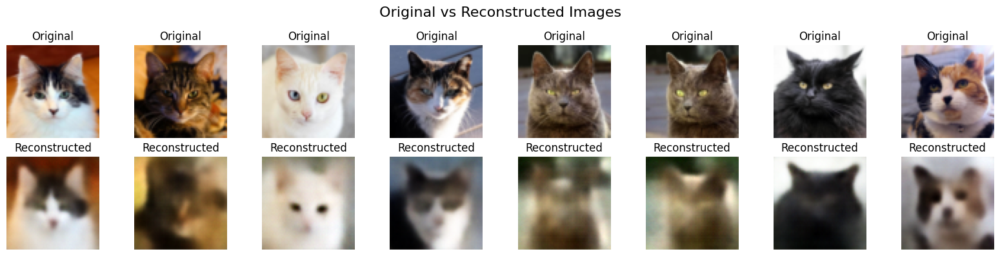

In [18]:
data_iter = iter(val_loader)
images, _ = next(data_iter)
visualize_reconstructions(model, images, device)

#### <font color='red'>2. Model with kl_weight=0.1</font>

In [19]:
# Model training parameters
learning_rate=0.0001
step_size=10
gamma=0.5

kl_weight=0.1

num_epochs=40

latent_dim = 512 # define latent dimension

name=f"run_kl_wgt_{str(kl_weight)}_ep_{num_epochs}_latent_dim_{latent_dim}"
project="assignment-5-v2"


# Load model
model = ConvVAE(latent_dim=latent_dim).to(device)
# model

model = run_vae_training(
    model, train_loader, val_loader, device, 
    num_epochs=num_epochs, learning_rate=learning_rate,
    step_size=step_size, gamma=gamma,
    kl_weight=kl_weight,
    name=name, project=project
)

save_path = os.path.join(saved_model_folder, name)
torch.save(model, save_path)
print(f"Model saved at: {save_path}")

Training Name: run_kl_wgt_0.1_ep_40_latent_dim_512
Total num. of Epochs: 40
Learning Rate: 0.0001
KL Weight used for Loss function: 0.1



wandb: Currently logged in as: ahmadjaved97. Use `wandb login --relogin` to force relogin


  2%|█▍                                                      | 1/40 [00:10<06:30, 10.00s/it]


Epoch 1/40
Learning Rate: 0.000100
Train - Total: 1288.4435, Recon: 1236.6438, KL: 517.9968
Eval  - Total: 832.0195, Recon: 777.5456, KL: 544.7392


  5%|██▊                                                     | 2/40 [00:20<06:27, 10.20s/it]


Epoch 2/40
Learning Rate: 0.000100
Train - Total: 695.2330, Recon: 632.6024, KL: 626.3055
Eval  - Total: 591.3673, Recon: 526.3305, KL: 650.3685


  8%|████▏                                                   | 3/40 [00:30<06:21, 10.32s/it]


Epoch 3/40
Learning Rate: 0.000100
Train - Total: 597.5521, Recon: 528.9844, KL: 685.6768
Eval  - Total: 535.0150, Recon: 466.5609, KL: 684.5407


 10%|█████▌                                                  | 4/40 [00:40<06:06, 10.18s/it]


Epoch 4/40
Learning Rate: 0.000100
Train - Total: 548.9701, Recon: 477.7421, KL: 712.2808
Eval  - Total: 503.0447, Recon: 432.1050, KL: 709.3967


 12%|███████                                                 | 5/40 [00:51<05:58, 10.23s/it]


Epoch 5/40
Learning Rate: 0.000100
Train - Total: 512.6649, Recon: 439.7789, KL: 728.8598
Eval  - Total: 461.7431, Recon: 388.0235, KL: 737.1956


 15%|████████▍                                               | 6/40 [01:00<05:35,  9.88s/it]


Epoch 6/40
Learning Rate: 0.000100
Train - Total: 491.9234, Recon: 417.5771, KL: 743.4630
Eval  - Total: 458.6618, Recon: 385.2443, KL: 734.1749


 18%|█████████▊                                              | 7/40 [01:09<05:19,  9.68s/it]


Epoch 7/40
Learning Rate: 0.000100
Train - Total: 468.7570, Recon: 393.8793, KL: 748.7773
Eval  - Total: 426.8044, Recon: 352.5815, KL: 742.2290


 20%|███████████▏                                            | 8/40 [01:18<05:04,  9.51s/it]


Epoch 8/40
Learning Rate: 0.000100
Train - Total: 451.3919, Recon: 375.8554, KL: 755.3643
Eval  - Total: 407.2012, Recon: 332.3380, KL: 748.6324


 22%|████████████▌                                           | 9/40 [01:27<04:51,  9.39s/it]


Epoch 9/40
Learning Rate: 0.000100
Train - Total: 436.5646, Recon: 360.4710, KL: 760.9357
Eval  - Total: 405.0119, Recon: 330.3157, KL: 746.9617


 25%|█████████████▊                                         | 10/40 [01:36<04:38,  9.29s/it]


Epoch 10/40
Learning Rate: 0.000100
Train - Total: 420.0578, Recon: 343.8123, KL: 762.4550
Eval  - Total: 390.3987, Recon: 315.5269, KL: 748.7183


 28%|███████████████▏                                       | 11/40 [01:48<04:52, 10.09s/it]


Epoch 11/40
Learning Rate: 0.000050
Train - Total: 395.8228, Recon: 320.5650, KL: 752.5780
Eval  - Total: 361.9535, Recon: 288.8522, KL: 731.0130


 30%|████████████████▌                                      | 12/40 [02:02<05:13, 11.19s/it]


Epoch 12/40
Learning Rate: 0.000050
Train - Total: 386.7285, Recon: 312.0270, KL: 747.0158
Eval  - Total: 353.6013, Recon: 280.9899, KL: 726.1141


 32%|█████████████████▉                                     | 13/40 [02:17<05:30, 12.25s/it]


Epoch 13/40
Learning Rate: 0.000050
Train - Total: 382.9698, Recon: 308.0677, KL: 749.0211
Eval  - Total: 350.1095, Recon: 276.2839, KL: 738.2555


 35%|███████████████████▎                                   | 14/40 [02:29<05:22, 12.39s/it]


Epoch 14/40
Learning Rate: 0.000050
Train - Total: 379.8269, Recon: 304.7475, KL: 750.7942
Eval  - Total: 347.2363, Recon: 273.1491, KL: 740.8718


 38%|████████████████████▋                                  | 15/40 [02:44<05:26, 13.04s/it]


Epoch 15/40
Learning Rate: 0.000050
Train - Total: 372.7052, Recon: 297.4179, KL: 752.8727
Eval  - Total: 351.9476, Recon: 275.7188, KL: 762.2878


 40%|██████████████████████                                 | 16/40 [02:57<05:16, 13.17s/it]


Epoch 16/40
Learning Rate: 0.000050
Train - Total: 368.8549, Recon: 293.4061, KL: 754.4889
Eval  - Total: 349.7969, Recon: 275.4886, KL: 743.0832


 42%|███████████████████████▍                               | 17/40 [03:11<05:08, 13.40s/it]


Epoch 17/40
Learning Rate: 0.000050
Train - Total: 364.0833, Recon: 288.4115, KL: 756.7182
Eval  - Total: 341.4443, Recon: 267.5170, KL: 739.2734


 45%|████████████████████████▊                              | 18/40 [03:26<05:02, 13.75s/it]


Epoch 18/40
Learning Rate: 0.000050
Train - Total: 358.6674, Recon: 282.8264, KL: 758.4094
Eval  - Total: 351.3212, Recon: 276.1411, KL: 751.8008


 48%|██████████████████████████▏                            | 19/40 [03:39<04:42, 13.47s/it]


Epoch 19/40
Learning Rate: 0.000050
Train - Total: 356.6018, Recon: 280.5465, KL: 760.5533
Eval  - Total: 335.7919, Recon: 261.1553, KL: 746.3654


 50%|███████████████████████████▌                           | 20/40 [03:51<04:21, 13.09s/it]


Epoch 20/40
Learning Rate: 0.000050
Train - Total: 351.7227, Recon: 275.5639, KL: 761.5876
Eval  - Total: 327.0872, Recon: 252.3401, KL: 747.4711


 52%|████████████████████████████▉                          | 21/40 [04:06<04:22, 13.80s/it]


Epoch 21/40
Learning Rate: 0.000025
Train - Total: 339.5996, Recon: 263.6361, KL: 759.6354
Eval  - Total: 317.0147, Recon: 242.2431, KL: 747.7155


 55%|██████████████████████████████▎                        | 22/40 [04:19<04:03, 13.53s/it]


Epoch 22/40
Learning Rate: 0.000025
Train - Total: 336.3166, Recon: 260.3841, KL: 759.3244
Eval  - Total: 316.4434, Recon: 241.4434, KL: 749.9992


 57%|███████████████████████████████▌                       | 23/40 [04:31<03:42, 13.07s/it]


Epoch 23/40
Learning Rate: 0.000025
Train - Total: 334.9161, Recon: 258.9604, KL: 759.5570
Eval  - Total: 317.7203, Recon: 242.8545, KL: 748.6572


 60%|█████████████████████████████████                      | 24/40 [04:46<03:38, 13.68s/it]


Epoch 24/40
Learning Rate: 0.000025
Train - Total: 332.8123, Recon: 256.9484, KL: 758.6394
Eval  - Total: 313.2708, Recon: 239.0081, KL: 742.6261


 62%|██████████████████████████████████▍                    | 25/40 [04:56<03:06, 12.43s/it]


Epoch 25/40
Learning Rate: 0.000025
Train - Total: 329.3356, Recon: 253.3329, KL: 760.0274
Eval  - Total: 313.7149, Recon: 238.2675, KL: 754.4741


 65%|███████████████████████████████████▊                   | 26/40 [05:05<02:41, 11.56s/it]


Epoch 26/40
Learning Rate: 0.000025
Train - Total: 327.0831, Recon: 250.9907, KL: 760.9239
Eval  - Total: 313.0291, Recon: 238.1239, KL: 749.0526


 68%|█████████████████████████████████████▏                 | 27/40 [05:15<02:21, 10.87s/it]


Epoch 27/40
Learning Rate: 0.000025
Train - Total: 326.3766, Recon: 250.2277, KL: 761.4890
Eval  - Total: 312.3189, Recon: 237.2742, KL: 750.4470


 70%|██████████████████████████████████████▌                | 28/40 [05:27<02:15, 11.26s/it]


Epoch 28/40
Learning Rate: 0.000025
Train - Total: 324.8353, Recon: 248.5797, KL: 762.5557
Eval  - Total: 311.8889, Recon: 236.5802, KL: 753.0867


 72%|███████████████████████████████████████▉               | 29/40 [05:40<02:11, 11.92s/it]


Epoch 29/40
Learning Rate: 0.000025
Train - Total: 321.7966, Recon: 245.4400, KL: 763.5660
Eval  - Total: 310.5568, Recon: 235.9129, KL: 746.4389


 75%|█████████████████████████████████████████▎             | 30/40 [05:56<02:09, 12.96s/it]


Epoch 30/40
Learning Rate: 0.000025
Train - Total: 319.9971, Recon: 243.6278, KL: 763.6926
Eval  - Total: 307.5352, Recon: 232.5260, KL: 750.0924


 78%|██████████████████████████████████████████▋            | 31/40 [06:10<01:59, 13.26s/it]


Epoch 31/40
Learning Rate: 0.000013
Train - Total: 314.6632, Recon: 238.3297, KL: 763.3347
Eval  - Total: 304.1718, Recon: 229.0086, KL: 751.6323


 80%|████████████████████████████████████████████           | 32/40 [06:23<01:46, 13.32s/it]


Epoch 32/40
Learning Rate: 0.000013
Train - Total: 312.9006, Recon: 236.5105, KL: 763.9013
Eval  - Total: 303.5849, Recon: 228.1019, KL: 754.8300


 82%|█████████████████████████████████████████████▍         | 33/40 [06:35<01:30, 13.00s/it]


Epoch 33/40
Learning Rate: 0.000013
Train - Total: 311.6613, Recon: 235.2386, KL: 764.2263
Eval  - Total: 302.7811, Recon: 227.5337, KL: 752.4742


 85%|██████████████████████████████████████████████▊        | 34/40 [06:51<01:23, 13.85s/it]


Epoch 34/40
Learning Rate: 0.000013
Train - Total: 310.0769, Recon: 233.6603, KL: 764.1663
Eval  - Total: 302.7430, Recon: 226.6862, KL: 760.5677


 88%|████████████████████████████████████████████████▏      | 35/40 [07:05<01:08, 13.69s/it]


Epoch 35/40
Learning Rate: 0.000013
Train - Total: 309.3618, Recon: 232.9413, KL: 764.2047
Eval  - Total: 303.0322, Recon: 227.1066, KL: 759.2559


 90%|█████████████████████████████████████████████████▌     | 36/40 [07:18<00:53, 13.50s/it]


Epoch 36/40
Learning Rate: 0.000013
Train - Total: 308.9998, Recon: 232.4596, KL: 765.4021
Eval  - Total: 300.9828, Recon: 225.5698, KL: 754.1302


 92%|██████████████████████████████████████████████████▉    | 37/40 [07:31<00:40, 13.58s/it]


Epoch 37/40
Learning Rate: 0.000013
Train - Total: 308.6058, Recon: 232.0549, KL: 765.5096
Eval  - Total: 301.5177, Recon: 226.0593, KL: 754.5837


 95%|████████████████████████████████████████████████████▎  | 38/40 [07:45<00:27, 13.58s/it]


Epoch 38/40
Learning Rate: 0.000013
Train - Total: 306.2141, Recon: 229.6035, KL: 766.1067
Eval  - Total: 299.9816, Recon: 224.9667, KL: 750.1488


 98%|█████████████████████████████████████████████████████▋ | 39/40 [07:57<00:13, 13.09s/it]


Epoch 39/40
Learning Rate: 0.000013
Train - Total: 304.2906, Recon: 227.7897, KL: 765.0097
Eval  - Total: 300.2812, Recon: 224.9968, KL: 752.8442


100%|███████████████████████████████████████████████████████| 40/40 [08:11<00:00, 12.28s/it]


Epoch 40/40
Learning Rate: 0.000013
Train - Total: 305.0167, Recon: 228.4143, KL: 766.0240
Eval  - Total: 299.5822, Recon: 224.7155, KL: 748.6665


epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
learning_rate,██████████▄▄▄▄▄▄▄▄▄▄▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁
train/kl_loss,▁▄▆▆▇▇█████▇████████████████████████████
train/recon_loss,█▄▃▃▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/total_loss,█▄▃▃▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val/kl_loss,▁▄▅▆▇▇▇███▇▇▇▇█▇▇█▇████▇████▇███████████
val/recon_loss,█▅▄▄▃▃▃▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val/total_loss,█▅▄▄▃▃▃▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,40
learning_rate,1e-05
train/kl_loss,766.02401


Model saved at: ./saved_models/run_kl_wgt_0.1_ep_40_latent_dim_512


In [20]:
model = load_model(save_path)
max_samples = min(2000, len(val_loader.dataset))
fid_score = compute_fid_score(model, val_loader, device, max_samples=max_samples)
print(f"FID Score for model {name}: {fid_score}")

/tmp/ipykernel_1886659/2494337095.py:5: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load(model_path)


FID Score for model run_kl_wgt_0.1_ep_40_latent_dim_512: 122.6679916381836


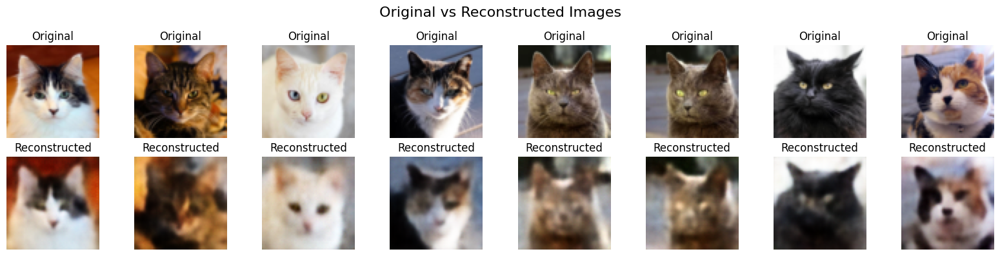

In [21]:
data_iter = iter(val_loader)
images, _ = next(data_iter)
visualize_reconstructions(model, images, device)

#### <font color='red'>3. Model with kl_weight=0.01</font>

In [22]:
# Model training parameters
learning_rate=0.0001
step_size=10
gamma=0.5

kl_weight=0.01

num_epochs=40

latent_dim = 512 # define latent dimension

name=f"run_kl_wgt_{str(kl_weight)}_ep_{num_epochs}_latent_dim_{latent_dim}"
project="assignment-5-v2"


# Load model
model = ConvVAE(latent_dim=latent_dim).to(device)
# model

model = run_vae_training(
    model, train_loader, val_loader, device, 
    num_epochs=num_epochs, learning_rate=learning_rate,
    step_size=step_size, gamma=gamma,
    kl_weight=kl_weight,
    name=name, project=project
)

save_path = os.path.join(saved_model_folder, name)
torch.save(model, save_path)
print(f"Model saved at: {save_path}")

Training Name: run_kl_wgt_0.01_ep_40_latent_dim_512
Total num. of Epochs: 40
Learning Rate: 0.0001
KL Weight used for Loss function: 0.01



  2%|█▍                                                      | 1/40 [00:10<07:03, 10.85s/it]


Epoch 1/40
Learning Rate: 0.000100
Train - Total: 1181.5184, Recon: 1166.5779, KL: 1494.0456
Eval  - Total: 712.0218, Recon: 697.3104, KL: 1471.1411


  5%|██▊                                                     | 2/40 [00:20<06:32, 10.32s/it]


Epoch 2/40
Learning Rate: 0.000100
Train - Total: 604.7859, Recon: 590.2766, KL: 1450.9332
Eval  - Total: 551.4014, Recon: 536.2569, KL: 1514.4445


  8%|████▏                                                   | 3/40 [00:31<06:32, 10.60s/it]


Epoch 3/40
Learning Rate: 0.000100
Train - Total: 498.4249, Recon: 482.8365, KL: 1558.8424
Eval  - Total: 470.2254, Recon: 454.3379, KL: 1588.7437


 10%|█████▌                                                  | 4/40 [00:45<07:07, 11.87s/it]


Epoch 4/40
Learning Rate: 0.000100
Train - Total: 446.1589, Recon: 429.8908, KL: 1626.8100
Eval  - Total: 439.4034, Recon: 422.6276, KL: 1677.5747


 12%|███████                                                 | 5/40 [00:58<07:08, 12.25s/it]


Epoch 5/40
Learning Rate: 0.000100
Train - Total: 412.0042, Recon: 395.1981, KL: 1680.6066
Eval  - Total: 375.2070, Recon: 358.3635, KL: 1684.3485


 15%|████████▍                                               | 6/40 [01:10<06:57, 12.28s/it]


Epoch 6/40
Learning Rate: 0.000100
Train - Total: 382.5836, Recon: 365.4151, KL: 1716.8560
Eval  - Total: 356.8070, Recon: 339.6048, KL: 1720.2183


 18%|█████████▊                                              | 7/40 [01:24<06:56, 12.61s/it]


Epoch 7/40
Learning Rate: 0.000100
Train - Total: 361.2686, Recon: 343.7655, KL: 1750.3139
Eval  - Total: 335.7222, Recon: 317.7866, KL: 1793.5590


 20%|███████████▏                                            | 8/40 [01:34<06:23, 11.97s/it]


Epoch 8/40
Learning Rate: 0.000100
Train - Total: 340.4030, Recon: 322.6188, KL: 1778.4254
Eval  - Total: 323.3161, Recon: 305.8722, KL: 1744.3857


 22%|████████████▌                                           | 9/40 [01:49<06:36, 12.78s/it]


Epoch 9/40
Learning Rate: 0.000100
Train - Total: 328.0825, Recon: 310.2251, KL: 1785.7359
Eval  - Total: 312.9822, Recon: 295.3630, KL: 1761.9243


 25%|█████████████▊                                         | 10/40 [02:00<06:04, 12.15s/it]


Epoch 10/40
Learning Rate: 0.000100
Train - Total: 317.7984, Recon: 299.7403, KL: 1805.8143
Eval  - Total: 295.4390, Recon: 277.7518, KL: 1768.7153


 28%|███████████████▏                                       | 11/40 [02:14<06:15, 12.93s/it]


Epoch 11/40
Learning Rate: 0.000050
Train - Total: 292.7143, Recon: 274.8081, KL: 1790.6277
Eval  - Total: 279.8568, Recon: 262.6657, KL: 1719.1170


 30%|████████████████▌                                      | 12/40 [02:24<05:33, 11.90s/it]


Epoch 12/40
Learning Rate: 0.000050
Train - Total: 284.5735, Recon: 266.9884, KL: 1758.5136
Eval  - Total: 279.5159, Recon: 261.8666, KL: 1764.9311


 32%|█████████████████▉                                     | 13/40 [02:34<05:09, 11.45s/it]


Epoch 13/40
Learning Rate: 0.000050
Train - Total: 278.1543, Recon: 260.7741, KL: 1738.0149
Eval  - Total: 265.5338, Recon: 248.4929, KL: 1704.0915


 35%|███████████████████▎                                   | 14/40 [02:44<04:46, 11.01s/it]


Epoch 14/40
Learning Rate: 0.000050
Train - Total: 275.4440, Recon: 258.1801, KL: 1726.3935
Eval  - Total: 266.1029, Recon: 248.9788, KL: 1712.4154


 38%|████████████████████▋                                  | 15/40 [02:55<04:35, 11.03s/it]


Epoch 15/40
Learning Rate: 0.000050
Train - Total: 268.9585, Recon: 251.7955, KL: 1716.2995
Eval  - Total: 257.9113, Recon: 241.0057, KL: 1690.5566


 40%|██████████████████████                                 | 16/40 [03:04<04:11, 10.49s/it]


Epoch 16/40
Learning Rate: 0.000050
Train - Total: 265.0731, Recon: 247.9598, KL: 1711.3235
Eval  - Total: 257.1931, Recon: 240.2922, KL: 1690.0961


 42%|███████████████████████▍                               | 17/40 [03:14<03:51, 10.08s/it]


Epoch 17/40
Learning Rate: 0.000050
Train - Total: 260.5162, Recon: 243.3892, KL: 1712.6986
Eval  - Total: 258.6364, Recon: 241.4888, KL: 1714.7557


 45%|████████████████████████▊                              | 18/40 [03:23<03:35,  9.80s/it]


Epoch 18/40
Learning Rate: 0.000050
Train - Total: 255.7772, Recon: 238.6858, KL: 1709.1396
Eval  - Total: 250.2218, Recon: 233.4345, KL: 1678.7286


 48%|██████████████████████████▏                            | 19/40 [03:32<03:22,  9.63s/it]


Epoch 19/40
Learning Rate: 0.000050
Train - Total: 251.7348, Recon: 234.6697, KL: 1706.5144
Eval  - Total: 246.2300, Recon: 229.5391, KL: 1669.0932


 50%|███████████████████████████▌                           | 20/40 [03:41<03:09,  9.46s/it]


Epoch 20/40
Learning Rate: 0.000050
Train - Total: 249.2206, Recon: 232.1693, KL: 1705.1260
Eval  - Total: 239.9666, Recon: 223.1359, KL: 1683.0754


 52%|████████████████████████████▉                          | 21/40 [03:50<02:57,  9.35s/it]


Epoch 21/40
Learning Rate: 0.000025
Train - Total: 236.0113, Recon: 218.9945, KL: 1701.6807
Eval  - Total: 236.2448, Recon: 219.5355, KL: 1670.9315


 55%|██████████████████████████████▎                        | 22/40 [03:59<02:47,  9.28s/it]


Epoch 22/40
Learning Rate: 0.000025
Train - Total: 234.0226, Recon: 217.1292, KL: 1689.3397
Eval  - Total: 233.5701, Recon: 217.1338, KL: 1643.6371


 57%|███████████████████████████████▌                       | 23/40 [04:08<02:36,  9.23s/it]


Epoch 23/40
Learning Rate: 0.000025
Train - Total: 231.3243, Recon: 214.5465, KL: 1677.7732
Eval  - Total: 232.2442, Recon: 215.8426, KL: 1640.1565


 60%|█████████████████████████████████                      | 24/40 [04:18<02:27,  9.21s/it]


Epoch 24/40
Learning Rate: 0.000025
Train - Total: 228.9212, Recon: 212.2307, KL: 1669.0523
Eval  - Total: 227.9347, Recon: 211.5488, KL: 1638.5836


 62%|██████████████████████████████████▍                    | 25/40 [04:27<02:18,  9.21s/it]


Epoch 25/40
Learning Rate: 0.000025
Train - Total: 227.8269, Recon: 211.2063, KL: 1662.0624
Eval  - Total: 229.6227, Recon: 213.3508, KL: 1627.1916


 65%|███████████████████████████████████▊                   | 26/40 [04:36<02:09,  9.24s/it]


Epoch 26/40
Learning Rate: 0.000025
Train - Total: 224.3612, Recon: 207.7899, KL: 1657.1248
Eval  - Total: 227.2606, Recon: 210.6728, KL: 1658.7715


 68%|█████████████████████████████████████▏                 | 27/40 [04:45<01:59,  9.21s/it]


Epoch 27/40
Learning Rate: 0.000025
Train - Total: 223.2917, Recon: 206.7812, KL: 1651.0585
Eval  - Total: 225.5863, Recon: 209.4820, KL: 1610.4252


 70%|██████████████████████████████████████▌                | 28/40 [04:55<01:51,  9.26s/it]


Epoch 28/40
Learning Rate: 0.000025
Train - Total: 221.5476, Recon: 205.0839, KL: 1646.3762
Eval  - Total: 225.4754, Recon: 208.8512, KL: 1662.4233


 72%|███████████████████████████████████████▉               | 29/40 [05:04<01:41,  9.23s/it]


Epoch 29/40
Learning Rate: 0.000025
Train - Total: 218.7652, Recon: 202.3401, KL: 1642.5103
Eval  - Total: 222.0096, Recon: 205.8333, KL: 1617.6229


 75%|█████████████████████████████████████████▎             | 30/40 [05:13<01:32,  9.24s/it]


Epoch 30/40
Learning Rate: 0.000025
Train - Total: 216.8967, Recon: 200.5038, KL: 1639.2831
Eval  - Total: 223.6924, Recon: 207.4000, KL: 1629.2418


 78%|██████████████████████████████████████████▋            | 31/40 [05:22<01:23,  9.25s/it]


Epoch 31/40
Learning Rate: 0.000013
Train - Total: 212.0464, Recon: 195.6675, KL: 1637.8868
Eval  - Total: 215.9413, Recon: 199.6796, KL: 1626.1733


 80%|████████████████████████████████████████████           | 32/40 [05:32<01:13,  9.24s/it]


Epoch 32/40
Learning Rate: 0.000013
Train - Total: 211.4101, Recon: 195.0773, KL: 1633.2823
Eval  - Total: 216.2632, Recon: 200.1570, KL: 1610.6257


 82%|█████████████████████████████████████████████▍         | 33/40 [05:41<01:04,  9.24s/it]


Epoch 33/40
Learning Rate: 0.000013
Train - Total: 210.2033, Recon: 193.9075, KL: 1629.5784
Eval  - Total: 214.7574, Recon: 198.5257, KL: 1623.1745


 85%|██████████████████████████████████████████████▊        | 34/40 [05:50<00:55,  9.25s/it]


Epoch 34/40
Learning Rate: 0.000013
Train - Total: 208.3546, Recon: 192.0959, KL: 1625.8719
Eval  - Total: 213.2945, Recon: 197.3196, KL: 1597.4902


 88%|████████████████████████████████████████████████▏      | 35/40 [05:59<00:46,  9.23s/it]


Epoch 35/40
Learning Rate: 0.000013
Train - Total: 207.4136, Recon: 191.1914, KL: 1622.2151
Eval  - Total: 213.8694, Recon: 198.0028, KL: 1586.6614


 90%|█████████████████████████████████████████████████▌     | 36/40 [06:08<00:36,  9.19s/it]


Epoch 36/40
Learning Rate: 0.000013
Train - Total: 206.3468, Recon: 190.1475, KL: 1619.9342
Eval  - Total: 213.2889, Recon: 197.3018, KL: 1598.7146


 92%|██████████████████████████████████████████████████▉    | 37/40 [06:17<00:27,  9.19s/it]


Epoch 37/40
Learning Rate: 0.000013
Train - Total: 204.9829, Recon: 188.8163, KL: 1616.6597
Eval  - Total: 214.0022, Recon: 198.0505, KL: 1595.1780


 95%|████████████████████████████████████████████████████▎  | 38/40 [06:27<00:18,  9.17s/it]


Epoch 38/40
Learning Rate: 0.000013
Train - Total: 205.0579, Recon: 188.9180, KL: 1613.9949
Eval  - Total: 212.7349, Recon: 196.7752, KL: 1595.9697


 98%|█████████████████████████████████████████████████████▋ | 39/40 [06:36<00:09,  9.17s/it]


Epoch 39/40
Learning Rate: 0.000013
Train - Total: 203.7577, Recon: 187.6321, KL: 1612.5522
Eval  - Total: 210.4551, Recon: 194.5309, KL: 1592.4199


100%|███████████████████████████████████████████████████████| 40/40 [06:45<00:00, 10.14s/it]


Epoch 40/40
Learning Rate: 0.000013
Train - Total: 202.5634, Recon: 186.4527, KL: 1611.0695
Eval  - Total: 212.7569, Recon: 196.8003, KL: 1595.6580


epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
learning_rate,██████████▄▄▄▄▄▄▄▄▄▄▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁
train/kl_loss,▂▁▃▄▆▆▇▇███▇▇▆▆▆▆▆▆▆▆▆▅▅▅▅▅▅▅▅▅▅▅▄▄▄▄▄▄▄
train/recon_loss,█▄▃▃▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/total_loss,█▄▃▃▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val/kl_loss,▁▂▄▅▆▆█▇▇▇▆▇▆▆▆▆▆▆▅▆▅▅▅▅▄▅▄▅▄▄▄▄▄▄▄▄▄▄▄▄
val/recon_loss,█▆▅▄▃▃▃▃▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val/total_loss,█▆▅▄▃▃▃▃▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,40
learning_rate,1e-05
train/kl_loss,1611.06947


Model saved at: ./saved_models/run_kl_wgt_0.01_ep_40_latent_dim_512


In [23]:
model = load_model(save_path)
max_samples = min(2000, len(val_loader.dataset))
fid_score = compute_fid_score(model, val_loader, device, max_samples=max_samples)
print(f"FID Score for model {name}: {fid_score}")

/tmp/ipykernel_1886659/2494337095.py:5: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load(model_path)


FID Score for model run_kl_wgt_0.01_ep_40_latent_dim_512: 116.9962158203125


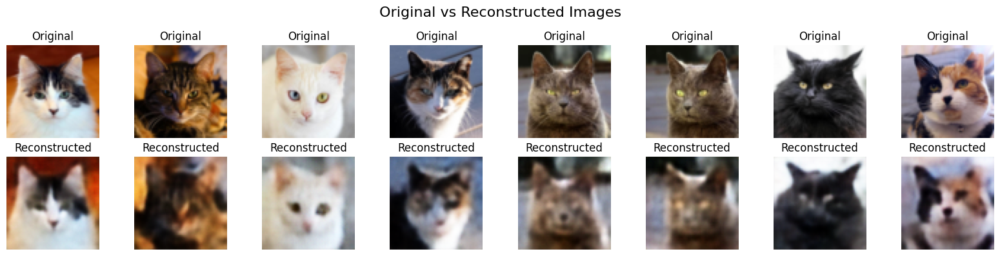

In [24]:
data_iter = iter(val_loader)
images, _ = next(data_iter)
visualize_reconstructions(model, images, device)

#### <font color='red'>4. Model with kl_weight=0.001</font>

In [25]:
# Model training parameters
learning_rate=0.0001
step_size=10
gamma=0.5

kl_weight=0.001

num_epochs=40

latent_dim = 512 # define latent dimension

name=f"run_kl_wgt_{str(kl_weight)}_ep_{num_epochs}_latent_dim_{latent_dim}"
project="assignment-5-v2"


# Load model
model = ConvVAE(latent_dim=latent_dim).to(device)
# model

model = run_vae_training(
    model, train_loader, val_loader, device, 
    num_epochs=num_epochs, learning_rate=learning_rate,
    step_size=step_size, gamma=gamma,
    kl_weight=kl_weight,
    name=name, project=project
)

save_path = os.path.join(saved_model_folder, name)
torch.save(model, save_path)
print(f"Model saved at: {save_path}")

Training Name: run_kl_wgt_0.001_ep_40_latent_dim_512
Total num. of Epochs: 40
Learning Rate: 0.0001
KL Weight used for Loss function: 0.001



  2%|█▍                                                      | 1/40 [00:09<06:01,  9.27s/it]


Epoch 1/40
Learning Rate: 0.000100
Train - Total: 1205.5347, Recon: 1202.0513, KL: 3483.4063
Eval  - Total: 688.4095, Recon: 686.2839, KL: 2125.5886


  5%|██▊                                                     | 2/40 [00:18<05:52,  9.27s/it]


Epoch 2/40
Learning Rate: 0.000100
Train - Total: 587.9639, Recon: 585.6678, KL: 2296.1871
Eval  - Total: 514.4709, Recon: 511.9555, KL: 2515.3943


  8%|████▏                                                   | 3/40 [00:27<05:42,  9.26s/it]


Epoch 3/40
Learning Rate: 0.000100
Train - Total: 482.1384, Recon: 479.5534, KL: 2584.9820
Eval  - Total: 459.3856, Recon: 456.5578, KL: 2827.7235


 10%|█████▌                                                  | 4/40 [00:37<05:33,  9.27s/it]


Epoch 4/40
Learning Rate: 0.000100
Train - Total: 434.3168, Recon: 431.5614, KL: 2755.3510
Eval  - Total: 433.4627, Recon: 430.6415, KL: 2821.2776


 12%|███████                                                 | 5/40 [00:46<05:23,  9.24s/it]


Epoch 5/40
Learning Rate: 0.000100
Train - Total: 394.1260, Recon: 391.2313, KL: 2894.7666
Eval  - Total: 368.4596, Recon: 365.5926, KL: 2867.0258


 15%|████████▍                                               | 6/40 [00:55<05:13,  9.21s/it]


Epoch 6/40
Learning Rate: 0.000100
Train - Total: 365.9798, Recon: 362.9698, KL: 3009.9892
Eval  - Total: 342.8839, Recon: 339.8152, KL: 3068.6938


 18%|█████████▊                                              | 7/40 [01:04<05:03,  9.20s/it]


Epoch 7/40
Learning Rate: 0.000100
Train - Total: 347.1384, Recon: 344.0543, KL: 3084.0686
Eval  - Total: 347.5611, Recon: 344.4082, KL: 3152.8730


 20%|███████████▏                                            | 8/40 [01:13<04:54,  9.21s/it]


Epoch 8/40
Learning Rate: 0.000100
Train - Total: 324.8561, Recon: 321.6925, KL: 3163.6076
Eval  - Total: 307.8080, Recon: 304.5818, KL: 3226.1389


 22%|████████████▌                                           | 9/40 [01:23<04:45,  9.21s/it]


Epoch 9/40
Learning Rate: 0.000100
Train - Total: 307.0118, Recon: 303.7842, KL: 3227.5283
Eval  - Total: 300.7625, Recon: 297.4762, KL: 3286.2721


 25%|█████████████▊                                         | 10/40 [01:32<04:36,  9.22s/it]


Epoch 10/40
Learning Rate: 0.000100
Train - Total: 295.8493, Recon: 292.5846, KL: 3264.7295
Eval  - Total: 282.9583, Recon: 279.5749, KL: 3383.4964


 28%|███████████████▏                                       | 11/40 [01:41<04:26,  9.20s/it]


Epoch 11/40
Learning Rate: 0.000050
Train - Total: 275.5004, Recon: 272.1491, KL: 3351.3796
Eval  - Total: 269.0626, Recon: 265.6589, KL: 3403.7190


 30%|████████████████▌                                      | 12/40 [01:50<04:17,  9.18s/it]


Epoch 12/40
Learning Rate: 0.000050
Train - Total: 269.8388, Recon: 266.5089, KL: 3329.8835
Eval  - Total: 260.1725, Recon: 256.7951, KL: 3377.3530


 32%|█████████████████▉                                     | 13/40 [01:59<04:06,  9.15s/it]


Epoch 13/40
Learning Rate: 0.000050
Train - Total: 263.8882, Recon: 260.5688, KL: 3319.4169
Eval  - Total: 253.5069, Recon: 250.2207, KL: 3286.2310


 35%|███████████████████▎                                   | 14/40 [02:08<03:58,  9.16s/it]


Epoch 14/40
Learning Rate: 0.000050
Train - Total: 258.0653, Recon: 254.7645, KL: 3300.7488
Eval  - Total: 257.1736, Recon: 253.8625, KL: 3311.1338


 38%|████████████████████▋                                  | 15/40 [02:18<03:49,  9.19s/it]


Epoch 15/40
Learning Rate: 0.000050
Train - Total: 253.3129, Recon: 250.0145, KL: 3298.3732
Eval  - Total: 246.9728, Recon: 243.7530, KL: 3219.7615


 40%|██████████████████████                                 | 16/40 [02:27<03:40,  9.18s/it]


Epoch 16/40
Learning Rate: 0.000050
Train - Total: 247.8561, Recon: 244.5690, KL: 3287.1089
Eval  - Total: 242.5558, Recon: 239.2929, KL: 3262.8464


 42%|███████████████████████▍                               | 17/40 [02:36<03:30,  9.13s/it]


Epoch 17/40
Learning Rate: 0.000050
Train - Total: 243.7701, Recon: 240.4873, KL: 3282.7239
Eval  - Total: 251.9063, Recon: 248.6196, KL: 3286.7114


 45%|████████████████████████▊                              | 18/40 [02:45<03:22,  9.19s/it]


Epoch 18/40
Learning Rate: 0.000050
Train - Total: 239.2989, Recon: 236.0275, KL: 3271.4591
Eval  - Total: 237.2136, Recon: 233.9753, KL: 3238.2650


 48%|██████████████████████████▏                            | 19/40 [02:54<03:13,  9.20s/it]


Epoch 19/40
Learning Rate: 0.000050
Train - Total: 234.5763, Recon: 231.3008, KL: 3275.5489
Eval  - Total: 231.0014, Recon: 227.8287, KL: 3172.6334


 50%|███████████████████████████▌                           | 20/40 [03:04<03:04,  9.20s/it]


Epoch 20/40
Learning Rate: 0.000050
Train - Total: 230.4449, Recon: 227.1689, KL: 3275.9750
Eval  - Total: 226.2177, Recon: 222.9483, KL: 3269.4101


 52%|████████████████████████████▉                          | 21/40 [03:13<02:54,  9.19s/it]


Epoch 21/40
Learning Rate: 0.000025
Train - Total: 221.0919, Recon: 217.7967, KL: 3295.2007
Eval  - Total: 217.5582, Recon: 214.2811, KL: 3277.1316


 55%|██████████████████████████████▎                        | 22/40 [03:22<02:45,  9.18s/it]


Epoch 22/40
Learning Rate: 0.000025
Train - Total: 218.5238, Recon: 215.2379, KL: 3285.8847
Eval  - Total: 215.8405, Recon: 212.6131, KL: 3227.3415


 57%|███████████████████████████████▌                       | 23/40 [03:31<02:35,  9.17s/it]


Epoch 23/40
Learning Rate: 0.000025
Train - Total: 217.2665, Recon: 213.9891, KL: 3277.3928
Eval  - Total: 217.5711, Recon: 214.3665, KL: 3204.5815


 60%|█████████████████████████████████                      | 24/40 [03:40<02:26,  9.14s/it]


Epoch 24/40
Learning Rate: 0.000025
Train - Total: 213.8340, Recon: 210.5696, KL: 3264.4106
Eval  - Total: 213.1817, Recon: 209.9436, KL: 3238.1099


 62%|██████████████████████████████████▍                    | 25/40 [03:49<02:18,  9.21s/it]


Epoch 25/40
Learning Rate: 0.000025
Train - Total: 211.2113, Recon: 207.9566, KL: 3254.7668
Eval  - Total: 212.6165, Recon: 209.3774, KL: 3239.1040


 65%|███████████████████████████████████▊                   | 26/40 [03:59<02:08,  9.18s/it]


Epoch 26/40
Learning Rate: 0.000025
Train - Total: 209.8112, Recon: 206.5737, KL: 3237.5586
Eval  - Total: 214.5428, Recon: 211.3564, KL: 3186.3429


 68%|█████████████████████████████████████▏                 | 27/40 [04:08<01:59,  9.21s/it]


Epoch 27/40
Learning Rate: 0.000025
Train - Total: 208.4059, Recon: 205.1788, KL: 3227.0616
Eval  - Total: 210.7338, Recon: 207.5545, KL: 3179.3620


 70%|██████████████████████████████████████▌                | 28/40 [04:17<01:50,  9.20s/it]


Epoch 28/40
Learning Rate: 0.000025
Train - Total: 205.6782, Recon: 202.4585, KL: 3219.6532
Eval  - Total: 207.9870, Recon: 204.7639, KL: 3223.1165


 72%|███████████████████████████████████████▉               | 29/40 [04:26<01:40,  9.16s/it]


Epoch 29/40
Learning Rate: 0.000025
Train - Total: 203.5937, Recon: 200.3835, KL: 3210.2031
Eval  - Total: 206.9839, Recon: 203.7631, KL: 3220.7236


 75%|█████████████████████████████████████████▎             | 30/40 [04:35<01:31,  9.14s/it]


Epoch 30/40
Learning Rate: 0.000025
Train - Total: 202.3956, Recon: 199.1940, KL: 3201.5642
Eval  - Total: 205.7196, Recon: 202.5511, KL: 3168.5511


 78%|██████████████████████████████████████████▋            | 31/40 [04:44<01:22,  9.15s/it]


Epoch 31/40
Learning Rate: 0.000013
Train - Total: 197.4028, Recon: 194.1932, KL: 3209.5839
Eval  - Total: 201.7405, Recon: 198.5217, KL: 3218.8578


 80%|████████████████████████████████████████████           | 32/40 [04:53<01:13,  9.14s/it]


Epoch 32/40
Learning Rate: 0.000013
Train - Total: 196.0994, Recon: 192.8923, KL: 3207.1308
Eval  - Total: 200.7151, Recon: 197.5208, KL: 3194.3120


 82%|█████████████████████████████████████████████▍         | 33/40 [05:03<01:04,  9.17s/it]


Epoch 33/40
Learning Rate: 0.000013
Train - Total: 195.4385, Recon: 192.2380, KL: 3200.5293
Eval  - Total: 200.9403, Recon: 197.7089, KL: 3231.3571


 85%|██████████████████████████████████████████████▊        | 34/40 [05:12<00:54,  9.14s/it]


Epoch 34/40
Learning Rate: 0.000013
Train - Total: 194.6473, Recon: 191.4544, KL: 3192.9137
Eval  - Total: 199.0141, Recon: 195.8743, KL: 3139.7959


 88%|████████████████████████████████████████████████▏      | 35/40 [05:21<00:45,  9.16s/it]


Epoch 35/40
Learning Rate: 0.000013
Train - Total: 194.0237, Recon: 190.8388, KL: 3184.8890
Eval  - Total: 200.0879, Recon: 196.9732, KL: 3114.7028


 90%|█████████████████████████████████████████████████▌     | 36/40 [05:30<00:36,  9.19s/it]


Epoch 36/40
Learning Rate: 0.000013
Train - Total: 192.3961, Recon: 189.2148, KL: 3181.3307
Eval  - Total: 197.5141, Recon: 194.3266, KL: 3187.4520


 92%|██████████████████████████████████████████████████▉    | 37/40 [05:39<00:27,  9.21s/it]


Epoch 37/40
Learning Rate: 0.000013
Train - Total: 192.0564, Recon: 188.8844, KL: 3172.0201
Eval  - Total: 196.7849, Recon: 193.6897, KL: 3095.1900


 95%|████████████████████████████████████████████████████▎  | 38/40 [05:49<00:18,  9.22s/it]


Epoch 38/40
Learning Rate: 0.000013
Train - Total: 190.1057, Recon: 186.9386, KL: 3167.1282
Eval  - Total: 196.7785, Recon: 193.6809, KL: 3097.6410


 98%|█████████████████████████████████████████████████████▋ | 39/40 [05:58<00:09,  9.24s/it]


Epoch 39/40
Learning Rate: 0.000013
Train - Total: 189.6376, Recon: 186.4763, KL: 3161.2668
Eval  - Total: 196.9523, Recon: 193.7844, KL: 3167.8244


100%|███████████████████████████████████████████████████████| 40/40 [06:07<00:00,  9.19s/it]


Epoch 40/40
Learning Rate: 0.000013
Train - Total: 188.7325, Recon: 185.5823, KL: 3150.1258
Eval  - Total: 196.2699, Recon: 193.2180, KL: 3051.9108


epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
learning_rate,██████████▄▄▄▄▄▄▄▄▄▄▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁
train/kl_loss,█▁▃▄▅▅▆▆▆▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▆▆▆▆▆▆▆▆▆▆▆▆▆▆
train/recon_loss,█▄▃▃▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/total_loss,█▄▃▃▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val/kl_loss,▁▃▅▅▅▆▇▇▇███▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▆▇▆▆▇▆
val/recon_loss,█▆▅▄▃▃▃▃▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val/total_loss,█▆▅▄▃▃▃▃▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,40
learning_rate,1e-05
train/kl_loss,3150.12577


Model saved at: ./saved_models/run_kl_wgt_0.001_ep_40_latent_dim_512


In [26]:
model = load_model(save_path)
max_samples = min(2000, len(val_loader.dataset))
fid_score = compute_fid_score(model, val_loader, device, max_samples=max_samples)
print(f"FID Score for model {name}: {fid_score}")

/tmp/ipykernel_1886659/2494337095.py:5: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load(model_path)


FID Score for model run_kl_wgt_0.001_ep_40_latent_dim_512: 116.66500091552734


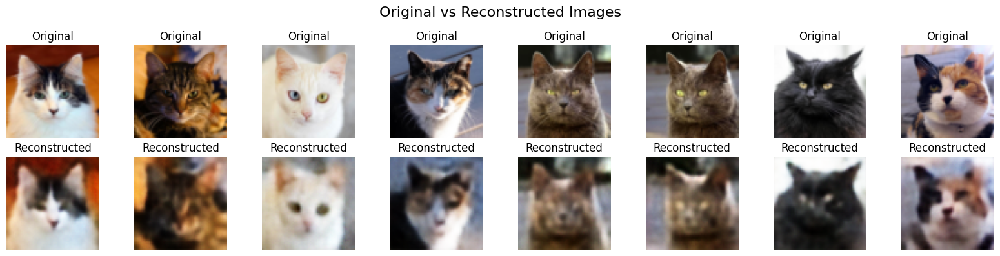

In [27]:
data_iter = iter(val_loader)
images, _ = next(data_iter)
visualize_reconstructions(model, images, device)

#### <font color='red'>5. Model with kl_weight=1.5</font>

In [28]:
# Model training parameters
learning_rate=0.0001
step_size=10
gamma=0.5

kl_weight=1.5

num_epochs=40

latent_dim = 512 # define latent dimension

name=f"run_kl_wgt_{str(kl_weight)}_ep_{num_epochs}_latent_dim_{latent_dim}"
project="assignment-5-v2"


# Load model
model = ConvVAE(latent_dim=latent_dim).to(device)
# model

model = run_vae_training(
    model, train_loader, val_loader, device, 
    num_epochs=num_epochs, learning_rate=learning_rate,
    step_size=step_size, gamma=gamma,
    kl_weight=kl_weight,
    name=name, project=project
)

save_path = os.path.join(saved_model_folder, name)
torch.save(model, save_path)
print(f"Model saved at: {save_path}")

Training Name: run_kl_wgt_1.5_ep_40_latent_dim_512
Total num. of Epochs: 40
Learning Rate: 0.0001
KL Weight used for Loss function: 1.5



  2%|█▍                                                      | 1/40 [00:09<05:52,  9.05s/it]


Epoch 1/40
Learning Rate: 0.000100
Train - Total: 1577.3921, Recon: 1408.9965, KL: 112.2637
Eval  - Total: 1548.4882, Recon: 1356.5669, KL: 127.9475


  5%|██▊                                                     | 2/40 [00:18<05:44,  9.07s/it]


Epoch 2/40
Learning Rate: 0.000100
Train - Total: 1162.5180, Recon: 965.8803, KL: 131.0918
Eval  - Total: 1194.2998, Recon: 988.1949, KL: 137.4033


  8%|████▏                                                   | 3/40 [00:27<05:35,  9.07s/it]


Epoch 3/40
Learning Rate: 0.000100
Train - Total: 1052.7086, Recon: 842.1593, KL: 140.3662
Eval  - Total: 1187.0521, Recon: 986.1494, KL: 133.9352


 10%|█████▌                                                  | 4/40 [00:36<05:27,  9.10s/it]


Epoch 4/40
Learning Rate: 0.000100
Train - Total: 994.5136, Recon: 783.0087, KL: 141.0032
Eval  - Total: 984.5990, Recon: 775.4794, KL: 139.4131


 12%|███████                                                 | 5/40 [00:45<05:18,  9.11s/it]


Epoch 5/40
Learning Rate: 0.000100
Train - Total: 946.9737, Recon: 738.4751, KL: 138.9991
Eval  - Total: 892.1257, Recon: 692.2492, KL: 133.2509


 15%|████████▍                                               | 6/40 [00:54<05:10,  9.12s/it]


Epoch 6/40
Learning Rate: 0.000100
Train - Total: 909.9798, Recon: 705.6348, KL: 136.2300
Eval  - Total: 831.1798, Recon: 636.0431, KL: 130.0911


 18%|█████████▊                                              | 7/40 [01:03<05:01,  9.12s/it]


Epoch 7/40
Learning Rate: 0.000100
Train - Total: 883.3164, Recon: 682.2355, KL: 134.0539
Eval  - Total: 844.0154, Recon: 655.7047, KL: 125.5404


 20%|███████████▏                                            | 8/40 [01:12<04:52,  9.15s/it]


Epoch 8/40
Learning Rate: 0.000100
Train - Total: 863.0056, Recon: 664.2854, KL: 132.4801
Eval  - Total: 819.7599, Recon: 618.1805, KL: 134.3863


 22%|████████████▌                                           | 9/40 [01:21<04:42,  9.12s/it]


Epoch 9/40
Learning Rate: 0.000100
Train - Total: 847.1335, Recon: 651.0978, KL: 130.6905
Eval  - Total: 776.3665, Recon: 581.2019, KL: 130.1097


 25%|█████████████▊                                         | 10/40 [01:31<04:32,  9.09s/it]


Epoch 10/40
Learning Rate: 0.000100
Train - Total: 822.3358, Recon: 629.3535, KL: 128.6549
Eval  - Total: 799.8943, Recon: 613.9757, KL: 123.9457


 28%|███████████████▏                                       | 11/40 [01:40<04:23,  9.09s/it]


Epoch 11/40
Learning Rate: 0.000050
Train - Total: 797.4739, Recon: 608.8902, KL: 125.7225
Eval  - Total: 740.4175, Recon: 559.6758, KL: 120.4944


 30%|████████████████▌                                      | 12/40 [01:49<04:14,  9.10s/it]


Epoch 12/40
Learning Rate: 0.000050
Train - Total: 786.3123, Recon: 598.8508, KL: 124.9743
Eval  - Total: 724.4537, Recon: 540.8836, KL: 122.3800


 32%|█████████████████▉                                     | 13/40 [01:58<04:05,  9.10s/it]


Epoch 13/40
Learning Rate: 0.000050
Train - Total: 778.9556, Recon: 592.0927, KL: 124.5753
Eval  - Total: 716.9998, Recon: 541.4714, KL: 117.0189


 35%|███████████████████▎                                   | 14/40 [02:07<03:56,  9.09s/it]


Epoch 14/40
Learning Rate: 0.000050
Train - Total: 776.3984, Recon: 589.4021, KL: 124.6642
Eval  - Total: 707.4859, Recon: 528.0652, KL: 119.6138


 38%|████████████████████▋                                  | 15/40 [02:16<03:47,  9.10s/it]


Epoch 15/40
Learning Rate: 0.000050
Train - Total: 767.0509, Recon: 579.7543, KL: 124.8644
Eval  - Total: 729.8764, Recon: 544.8432, KL: 123.3555


 40%|██████████████████████                                 | 16/40 [02:25<03:39,  9.13s/it]


Epoch 16/40
Learning Rate: 0.000050
Train - Total: 765.1208, Recon: 578.0953, KL: 124.6837
Eval  - Total: 710.8368, Recon: 530.1437, KL: 120.4621


 42%|███████████████████████▍                               | 17/40 [02:34<03:30,  9.17s/it]


Epoch 17/40
Learning Rate: 0.000050
Train - Total: 758.7477, Recon: 571.0472, KL: 125.1336
Eval  - Total: 748.6300, Recon: 569.0124, KL: 119.7451


 45%|████████████████████████▊                              | 18/40 [02:44<03:22,  9.19s/it]


Epoch 18/40
Learning Rate: 0.000050
Train - Total: 750.3406, Recon: 562.6939, KL: 125.0978
Eval  - Total: 745.2655, Recon: 566.6646, KL: 119.0673


 48%|██████████████████████████▏                            | 19/40 [02:53<03:13,  9.21s/it]


Epoch 19/40
Learning Rate: 0.000050
Train - Total: 744.3575, Recon: 555.8521, KL: 125.6703
Eval  - Total: 750.4409, Recon: 566.5588, KL: 122.5881


 50%|███████████████████████████▌                           | 20/40 [03:02<03:04,  9.23s/it]


Epoch 20/40
Learning Rate: 0.000050
Train - Total: 739.3672, Recon: 550.7739, KL: 125.7289
Eval  - Total: 723.0136, Recon: 545.9550, KL: 118.0390


 52%|████████████████████████████▉                          | 21/40 [03:11<02:54,  9.20s/it]


Epoch 21/40
Learning Rate: 0.000025
Train - Total: 727.4346, Recon: 540.2568, KL: 124.7852
Eval  - Total: 697.5249, Recon: 519.2767, KL: 118.8322


 55%|██████████████████████████████▎                        | 22/40 [03:21<02:45,  9.20s/it]


Epoch 22/40
Learning Rate: 0.000025
Train - Total: 724.5048, Recon: 537.0075, KL: 124.9982
Eval  - Total: 685.8044, Recon: 505.8470, KL: 119.9716


 57%|███████████████████████████████▌                       | 23/40 [03:30<02:36,  9.22s/it]


Epoch 23/40
Learning Rate: 0.000025
Train - Total: 720.0826, Recon: 532.7190, KL: 124.9091
Eval  - Total: 684.8487, Recon: 503.6621, KL: 120.7911


 60%|█████████████████████████████████                      | 24/40 [03:39<02:27,  9.24s/it]


Epoch 24/40
Learning Rate: 0.000025
Train - Total: 718.4337, Recon: 530.9943, KL: 124.9596
Eval  - Total: 683.1739, Recon: 499.8530, KL: 122.2139


 62%|██████████████████████████████████▍                    | 25/40 [03:48<02:19,  9.28s/it]


Epoch 25/40
Learning Rate: 0.000025
Train - Total: 716.3249, Recon: 528.3944, KL: 125.2870
Eval  - Total: 690.4019, Recon: 508.9526, KL: 120.9662


 65%|███████████████████████████████████▊                   | 26/40 [03:58<02:09,  9.29s/it]


Epoch 26/40
Learning Rate: 0.000025
Train - Total: 714.1129, Recon: 526.0528, KL: 125.3734
Eval  - Total: 670.7241, Recon: 490.6632, KL: 120.0406


 68%|█████████████████████████████████████▏                 | 27/40 [04:07<02:00,  9.24s/it]


Epoch 27/40
Learning Rate: 0.000025
Train - Total: 713.8882, Recon: 525.2270, KL: 125.7741
Eval  - Total: 660.8611, Recon: 478.0487, KL: 121.8749


 70%|██████████████████████████████████████▌                | 28/40 [04:16<01:50,  9.19s/it]


Epoch 28/40
Learning Rate: 0.000025
Train - Total: 711.1788, Recon: 522.8022, KL: 125.5844
Eval  - Total: 659.7332, Recon: 480.0686, KL: 119.7764


 72%|███████████████████████████████████████▉               | 29/40 [04:25<01:40,  9.16s/it]


Epoch 29/40
Learning Rate: 0.000025
Train - Total: 707.3895, Recon: 518.5897, KL: 125.8665
Eval  - Total: 669.1199, Recon: 485.1460, KL: 122.6492


 75%|█████████████████████████████████████████▎             | 30/40 [04:34<01:31,  9.12s/it]


Epoch 30/40
Learning Rate: 0.000025
Train - Total: 706.5283, Recon: 517.4600, KL: 126.0455
Eval  - Total: 659.1374, Recon: 476.6900, KL: 121.6316


 78%|██████████████████████████████████████████▋            | 31/40 [04:43<01:21,  9.10s/it]


Epoch 31/40
Learning Rate: 0.000013
Train - Total: 701.8552, Recon: 513.5634, KL: 125.5279
Eval  - Total: 652.8475, Recon: 470.6104, KL: 121.4914


 80%|████████████████████████████████████████████           | 32/40 [04:52<01:12,  9.10s/it]


Epoch 32/40
Learning Rate: 0.000013
Train - Total: 699.3259, Recon: 511.2356, KL: 125.3935
Eval  - Total: 655.2933, Recon: 472.5021, KL: 121.8608


 82%|█████████████████████████████████████████████▍         | 33/40 [05:01<01:03,  9.10s/it]


Epoch 33/40
Learning Rate: 0.000013
Train - Total: 697.7545, Recon: 509.4085, KL: 125.5640
Eval  - Total: 650.2797, Recon: 469.9910, KL: 120.1925


 85%|██████████████████████████████████████████████▊        | 34/40 [05:11<00:54,  9.11s/it]


Epoch 34/40
Learning Rate: 0.000013
Train - Total: 696.5127, Recon: 508.1127, KL: 125.6000
Eval  - Total: 650.3380, Recon: 468.3331, KL: 121.3366


 88%|████████████████████████████████████████████████▏      | 35/40 [05:20<00:45,  9.14s/it]


Epoch 35/40
Learning Rate: 0.000013
Train - Total: 695.4546, Recon: 506.8235, KL: 125.7540
Eval  - Total: 645.3784, Recon: 461.8724, KL: 122.3374


 90%|█████████████████████████████████████████████████▌     | 36/40 [05:29<00:36,  9.12s/it]


Epoch 36/40
Learning Rate: 0.000013
Train - Total: 694.9467, Recon: 505.8266, KL: 126.0801
Eval  - Total: 643.5035, Recon: 460.4052, KL: 122.0655


 92%|██████████████████████████████████████████████████▉    | 37/40 [05:38<00:27,  9.10s/it]


Epoch 37/40
Learning Rate: 0.000013
Train - Total: 694.2375, Recon: 505.3115, KL: 125.9506
Eval  - Total: 641.7401, Recon: 460.9983, KL: 120.4945


 95%|████████████████████████████████████████████████████▎  | 38/40 [05:47<00:18,  9.10s/it]


Epoch 38/40
Learning Rate: 0.000013
Train - Total: 693.2237, Recon: 504.2644, KL: 125.9729
Eval  - Total: 645.9427, Recon: 461.1237, KL: 123.2127


 98%|█████████████████████████████████████████████████████▋ | 39/40 [05:56<00:09,  9.17s/it]


Epoch 39/40
Learning Rate: 0.000013
Train - Total: 691.8838, Recon: 502.8914, KL: 125.9950
Eval  - Total: 642.3086, Recon: 461.1983, KL: 120.7402


100%|███████████████████████████████████████████████████████| 40/40 [06:06<00:00,  9.15s/it]


Epoch 40/40
Learning Rate: 0.000013
Train - Total: 691.6439, Recon: 502.5745, KL: 126.0463
Eval  - Total: 645.1924, Recon: 461.9114, KL: 122.1873


epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
learning_rate,██████████▄▄▄▄▄▄▄▄▄▄▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁
train/kl_loss,▁▆███▇▆▆▅▅▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄
train/recon_loss,█▅▄▃▃▃▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/total_loss,█▅▄▃▃▃▃▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val/kl_loss,▄▇▆█▆▅▄▆▅▃▂▃▁▂▃▂▂▂▃▁▂▂▂▃▂▂▃▂▃▂▂▃▂▂▃▃▂▃▂▃
val/recon_loss,█▅▅▃▃▂▃▂▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val/total_loss,█▅▅▄▃▂▃▂▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,40
learning_rate,1e-05
train/kl_loss,126.04627


Model saved at: ./saved_models/run_kl_wgt_1.5_ep_40_latent_dim_512


In [29]:
model = load_model(save_path)
max_samples = min(2000, len(val_loader.dataset))
fid_score = compute_fid_score(model, val_loader, device, max_samples=max_samples)
print(f"FID Score for model {name}: {fid_score}")

/tmp/ipykernel_1886659/2494337095.py:5: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load(model_path)


FID Score for model run_kl_wgt_1.5_ep_40_latent_dim_512: 157.549072265625


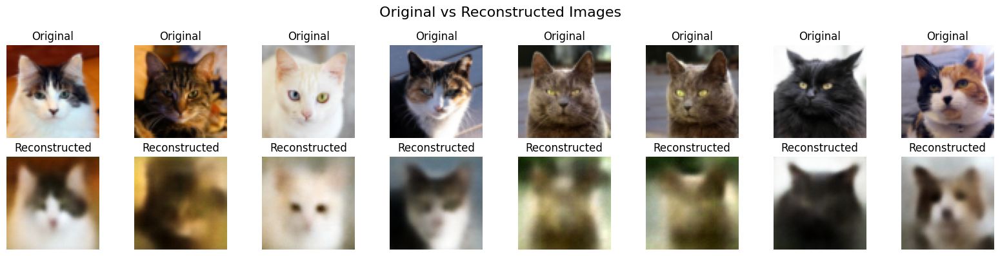

In [30]:
data_iter = iter(val_loader)
images, _ = next(data_iter)
visualize_reconstructions(model, images, device)

#### <font color='red'>6. Model with kl_weight=2</font>

In [31]:
# Model training parameters
learning_rate=0.0001
step_size=10
gamma=0.5

kl_weight=2

num_epochs=40

latent_dim = 512 # define latent dimension

name=f"run_kl_wgt_{str(kl_weight)}_ep_{num_epochs}_latent_dim_{latent_dim}"
project="assignment-5-v2"


# Load model
model = ConvVAE(latent_dim=latent_dim).to(device)
# model

model = run_vae_training(
    model, train_loader, val_loader, device, 
    num_epochs=num_epochs, learning_rate=learning_rate,
    step_size=step_size, gamma=gamma,
    kl_weight=kl_weight,
    name=name, project=project
)

save_path = os.path.join(saved_model_folder, name)
torch.save(model, save_path)
print(f"Model saved at: {save_path}")

Training Name: run_kl_wgt_2_ep_40_latent_dim_512
Total num. of Epochs: 40
Learning Rate: 0.0001
KL Weight used for Loss function: 2



  2%|█▍                                                      | 1/40 [00:09<05:59,  9.23s/it]


Epoch 1/40
Learning Rate: 0.000100
Train - Total: 1680.3621, Recon: 1487.6368, KL: 96.3627
Eval  - Total: 2834.4174, Recon: 2626.1163, KL: 104.1506


  5%|██▊                                                     | 2/40 [00:18<05:51,  9.24s/it]


Epoch 2/40
Learning Rate: 0.000100
Train - Total: 1249.2274, Recon: 1034.5994, KL: 107.3140
Eval  - Total: 1530.9900, Recon: 1313.6945, KL: 108.6478


  8%|████▏                                                   | 3/40 [00:27<05:42,  9.27s/it]


Epoch 3/40
Learning Rate: 0.000100
Train - Total: 1138.4374, Recon: 908.4061, KL: 115.0157
Eval  - Total: 1128.0360, Recon: 892.3010, KL: 117.8675


 10%|█████▌                                                  | 4/40 [00:37<05:33,  9.27s/it]


Epoch 4/40
Learning Rate: 0.000100
Train - Total: 1073.9766, Recon: 841.4963, KL: 116.2402
Eval  - Total: 1014.8824, Recon: 779.6643, KL: 117.6090


 12%|███████                                                 | 5/40 [00:46<05:23,  9.24s/it]


Epoch 5/40
Learning Rate: 0.000100
Train - Total: 1023.4664, Recon: 796.5044, KL: 113.4810
Eval  - Total: 973.0740, Recon: 763.0667, KL: 105.0037


 15%|████████▍                                               | 6/40 [00:55<05:13,  9.23s/it]


Epoch 6/40
Learning Rate: 0.000100
Train - Total: 984.3863, Recon: 762.7249, KL: 110.8307
Eval  - Total: 914.6737, Recon: 693.9196, KL: 110.3771


 18%|█████████▊                                              | 7/40 [01:04<05:02,  9.17s/it]


Epoch 7/40
Learning Rate: 0.000100
Train - Total: 952.0468, Recon: 734.7840, KL: 108.6314
Eval  - Total: 923.3985, Recon: 710.5777, KL: 106.4104


 20%|███████████▏                                            | 8/40 [01:13<04:52,  9.13s/it]


Epoch 8/40
Learning Rate: 0.000100
Train - Total: 925.8332, Recon: 712.4506, KL: 106.6913
Eval  - Total: 863.5920, Recon: 652.7739, KL: 105.4091


 22%|████████████▌                                           | 9/40 [01:22<04:43,  9.13s/it]


Epoch 9/40
Learning Rate: 0.000100
Train - Total: 908.1806, Recon: 697.3943, KL: 105.3931
Eval  - Total: 864.3776, Recon: 667.8994, KL: 98.2391


 25%|█████████████▊                                         | 10/40 [01:31<04:34,  9.15s/it]


Epoch 10/40
Learning Rate: 0.000100
Train - Total: 889.4841, Recon: 680.7935, KL: 104.3453
Eval  - Total: 817.6069, Recon: 618.7295, KL: 99.4387


 28%|███████████████▏                                       | 11/40 [01:40<04:24,  9.14s/it]


Epoch 11/40
Learning Rate: 0.000050
Train - Total: 857.8104, Recon: 655.6953, KL: 101.0575
Eval  - Total: 803.6720, Recon: 612.1113, KL: 95.7803


 30%|████████████████▌                                      | 12/40 [01:50<04:15,  9.12s/it]


Epoch 12/40
Learning Rate: 0.000050
Train - Total: 849.2850, Recon: 647.2674, KL: 101.0088
Eval  - Total: 786.9182, Recon: 589.7499, KL: 98.5841


 32%|█████████████████▉                                     | 13/40 [01:59<04:06,  9.12s/it]


Epoch 13/40
Learning Rate: 0.000050
Train - Total: 842.0133, Recon: 640.3731, KL: 100.8201
Eval  - Total: 807.3539, Recon: 615.7307, KL: 95.8116


 35%|███████████████████▎                                   | 14/40 [02:08<03:57,  9.13s/it]


Epoch 14/40
Learning Rate: 0.000050
Train - Total: 837.4325, Recon: 635.7755, KL: 100.8285
Eval  - Total: 775.9777, Recon: 576.0392, KL: 99.9693


 38%|████████████████████▋                                  | 15/40 [02:17<03:47,  9.12s/it]


Epoch 15/40
Learning Rate: 0.000050
Train - Total: 829.8278, Recon: 627.7942, KL: 101.0168
Eval  - Total: 779.1464, Recon: 586.2134, KL: 96.4665


 40%|██████████████████████                                 | 16/40 [02:26<03:38,  9.12s/it]


Epoch 16/40
Learning Rate: 0.000050
Train - Total: 826.1362, Recon: 623.2023, KL: 101.4670
Eval  - Total: 824.2200, Recon: 629.0242, KL: 97.5979


 42%|███████████████████████▍                               | 17/40 [02:35<03:29,  9.10s/it]


Epoch 17/40
Learning Rate: 0.000050
Train - Total: 818.7506, Recon: 615.4950, KL: 101.6278
Eval  - Total: 883.8050, Recon: 688.8172, KL: 97.4939


 45%|████████████████████████▊                              | 18/40 [02:44<03:20,  9.09s/it]


Epoch 18/40
Learning Rate: 0.000050
Train - Total: 812.3895, Recon: 608.5554, KL: 101.9170
Eval  - Total: 863.4759, Recon: 666.1787, KL: 98.6486


 48%|██████████████████████████▏                            | 19/40 [02:53<03:12,  9.15s/it]


Epoch 19/40
Learning Rate: 0.000050
Train - Total: 807.6635, Recon: 603.7366, KL: 101.9634
Eval  - Total: 853.2289, Recon: 658.4599, KL: 97.3845


 50%|███████████████████████████▌                           | 20/40 [03:03<03:03,  9.15s/it]


Epoch 20/40
Learning Rate: 0.000050
Train - Total: 805.2763, Recon: 600.3955, KL: 102.4404
Eval  - Total: 826.1009, Recon: 624.9490, KL: 100.5759


 52%|████████████████████████████▉                          | 21/40 [03:12<02:54,  9.16s/it]


Epoch 21/40
Learning Rate: 0.000025
Train - Total: 789.2968, Recon: 586.6870, KL: 101.3049
Eval  - Total: 828.1075, Recon: 631.1532, KL: 98.4772


 55%|██████████████████████████████▎                        | 22/40 [03:21<02:46,  9.22s/it]


Epoch 22/40
Learning Rate: 0.000025
Train - Total: 787.9412, Recon: 584.9287, KL: 101.5063
Eval  - Total: 804.7631, Recon: 607.3435, KL: 98.7098


 57%|███████████████████████████████▌                       | 23/40 [03:30<02:36,  9.22s/it]


Epoch 23/40
Learning Rate: 0.000025
Train - Total: 785.0875, Recon: 581.8765, KL: 101.6055
Eval  - Total: 794.2783, Recon: 595.7527, KL: 99.2628


 60%|█████████████████████████████████                      | 24/40 [03:40<02:27,  9.24s/it]


Epoch 24/40
Learning Rate: 0.000025
Train - Total: 781.7684, Recon: 578.0943, KL: 101.8371
Eval  - Total: 801.9793, Recon: 605.8045, KL: 98.0874


 62%|██████████████████████████████████▍                    | 25/40 [03:49<02:18,  9.24s/it]


Epoch 25/40
Learning Rate: 0.000025
Train - Total: 779.6660, Recon: 576.5377, KL: 101.5641
Eval  - Total: 776.1889, Recon: 580.4001, KL: 97.8944


 65%|███████████████████████████████████▊                   | 26/40 [03:58<02:09,  9.23s/it]


Epoch 26/40
Learning Rate: 0.000025
Train - Total: 777.5931, Recon: 573.6112, KL: 101.9909
Eval  - Total: 774.0958, Recon: 576.0959, KL: 98.9999


 68%|█████████████████████████████████████▏                 | 27/40 [04:07<01:59,  9.23s/it]


Epoch 27/40
Learning Rate: 0.000025
Train - Total: 775.5889, Recon: 571.6596, KL: 101.9647
Eval  - Total: 769.1848, Recon: 571.3759, KL: 98.9044


 70%|██████████████████████████████████████▌                | 28/40 [04:17<01:50,  9.22s/it]


Epoch 28/40
Learning Rate: 0.000025
Train - Total: 775.1842, Recon: 570.6526, KL: 102.2658
Eval  - Total: 744.1605, Recon: 544.2665, KL: 99.9470


 72%|███████████████████████████████████████▉               | 29/40 [04:26<01:41,  9.24s/it]


Epoch 29/40
Learning Rate: 0.000025
Train - Total: 772.3896, Recon: 567.6061, KL: 102.3918
Eval  - Total: 769.4471, Recon: 570.7084, KL: 99.3694


 75%|█████████████████████████████████████████▎             | 30/40 [04:35<01:32,  9.20s/it]


Epoch 30/40
Learning Rate: 0.000025
Train - Total: 769.3984, Recon: 564.4936, KL: 102.4524
Eval  - Total: 743.3879, Recon: 541.7825, KL: 100.8027


 78%|██████████████████████████████████████████▋            | 31/40 [04:44<01:22,  9.16s/it]


Epoch 31/40
Learning Rate: 0.000013
Train - Total: 764.5083, Recon: 560.5271, KL: 101.9906
Eval  - Total: 739.4255, Recon: 540.8673, KL: 99.2791


 80%|████████████████████████████████████████████           | 32/40 [04:53<01:13,  9.13s/it]


Epoch 32/40
Learning Rate: 0.000013
Train - Total: 762.5121, Recon: 557.9837, KL: 102.2642
Eval  - Total: 744.8408, Recon: 542.2657, KL: 101.2876


 82%|█████████████████████████████████████████████▍         | 33/40 [05:02<01:03,  9.11s/it]


Epoch 33/40
Learning Rate: 0.000013
Train - Total: 760.3679, Recon: 556.6664, KL: 101.8507
Eval  - Total: 737.0581, Recon: 540.3036, KL: 98.3772


 85%|██████████████████████████████████████████████▊        | 34/40 [05:11<00:54,  9.15s/it]


Epoch 34/40
Learning Rate: 0.000013
Train - Total: 760.1823, Recon: 555.9689, KL: 102.1067
Eval  - Total: 740.0242, Recon: 542.2567, KL: 98.8838


 88%|████████████████████████████████████████████████▏      | 35/40 [05:20<00:45,  9.12s/it]


Epoch 35/40
Learning Rate: 0.000013
Train - Total: 759.6915, Recon: 555.1528, KL: 102.2694
Eval  - Total: 734.3565, Recon: 534.0429, KL: 100.1568


 90%|█████████████████████████████████████████████████▌     | 36/40 [05:30<00:36,  9.11s/it]


Epoch 36/40
Learning Rate: 0.000013
Train - Total: 758.0417, Recon: 553.4873, KL: 102.2772
Eval  - Total: 726.6356, Recon: 525.9465, KL: 100.3446


 92%|██████████████████████████████████████████████████▉    | 37/40 [05:39<00:27,  9.12s/it]


Epoch 37/40
Learning Rate: 0.000013
Train - Total: 757.7522, Recon: 553.1640, KL: 102.2941
Eval  - Total: 729.4088, Recon: 531.8417, KL: 98.7835


 95%|████████████████████████████████████████████████████▎  | 38/40 [05:48<00:18,  9.11s/it]


Epoch 38/40
Learning Rate: 0.000013
Train - Total: 755.1065, Recon: 550.5239, KL: 102.2913
Eval  - Total: 733.8533, Recon: 537.7185, KL: 98.0674


 98%|█████████████████████████████████████████████████████▋ | 39/40 [05:57<00:09,  9.12s/it]


Epoch 39/40
Learning Rate: 0.000013
Train - Total: 755.9894, Recon: 551.1943, KL: 102.3976
Eval  - Total: 731.1344, Recon: 532.2346, KL: 99.4499


100%|███████████████████████████████████████████████████████| 40/40 [06:06<00:00,  9.16s/it]


Epoch 40/40
Learning Rate: 0.000013
Train - Total: 754.1679, Recon: 549.1276, KL: 102.5201
Eval  - Total: 720.9325, Recon: 521.2809, KL: 99.8258


epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
learning_rate,██████████▄▄▄▄▄▄▄▄▄▄▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁
train/kl_loss,▁▅██▇▆▅▅▄▄▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃
train/recon_loss,█▅▄▃▃▃▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/total_loss,█▅▄▃▃▃▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val/kl_loss,▄▅██▄▆▄▄▂▂▁▂▁▂▁▂▂▂▂▃▂▂▂▂▂▂▂▂▂▃▂▃▂▂▂▂▂▂▂▂
val/recon_loss,█▄▂▂▂▂▂▁▁▁▁▁▁▁▁▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val/total_loss,█▄▂▂▂▂▂▁▁▁▁▁▁▁▁▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,40
learning_rate,1e-05
train/kl_loss,102.52014


Model saved at: ./saved_models/run_kl_wgt_2_ep_40_latent_dim_512


In [32]:
model = load_model(save_path)
max_samples = min(2000, len(val_loader.dataset))
fid_score = compute_fid_score(model, val_loader, device, max_samples=max_samples)
print(f"FID Score for model {name}: {fid_score}")

/tmp/ipykernel_1886659/2494337095.py:5: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load(model_path)


FID Score for model run_kl_wgt_2_ep_40_latent_dim_512: 162.39413452148438


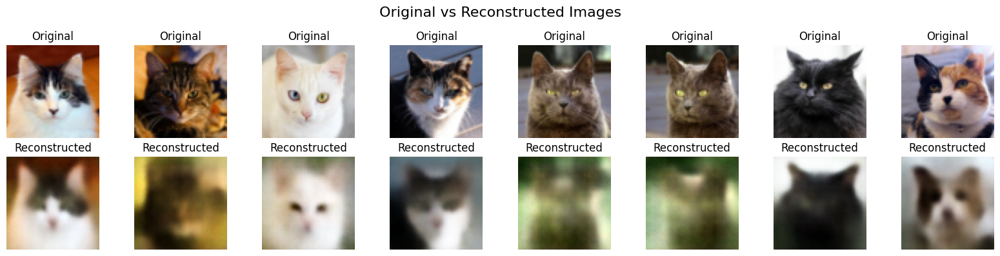

In [33]:
data_iter = iter(val_loader)
images, _ = next(data_iter)
visualize_reconstructions(model, images, device)

#### <font color='red'>7. Model with kl_weight=5</font>

In [34]:
# Model training parameters
learning_rate=0.0001
step_size=10
gamma=0.5

kl_weight=5

num_epochs=40

latent_dim = 512 # define latent dimension

name=f"run_kl_wgt_{str(kl_weight)}_ep_{num_epochs}_latent_dim_{latent_dim}"
project="assignment-5-v2"


# Load model
model = ConvVAE(latent_dim=latent_dim).to(device)
# model

model = run_vae_training(
    model, train_loader, val_loader, device, 
    num_epochs=num_epochs, learning_rate=learning_rate,
    step_size=step_size, gamma=gamma,
    kl_weight=kl_weight,
    name=name, project=project
)

save_path = os.path.join(saved_model_folder, name)
torch.save(model, save_path)
print(f"Model saved at: {save_path}")

Training Name: run_kl_wgt_5_ep_40_latent_dim_512
Total num. of Epochs: 40
Learning Rate: 0.0001
KL Weight used for Loss function: 5



Traceback (most recent call last):
  File "/home/user/javeda1/miniconda3/lib/python3.12/multiprocessing/util.py", line 303, in _run_finalizers
    finalizer()
  File "/home/user/javeda1/miniconda3/lib/python3.12/multiprocessing/util.py", line 227, in __call__
    res = self._callback(*self._args, **self._kwargs)
          ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/user/javeda1/miniconda3/lib/python3.12/multiprocessing/util.py", line 136, in _remove_temp_dir
    rmtree(tempdir, onerror=onerror)
  File "/home/user/javeda1/miniconda3/lib/python3.12/shutil.py", line 759, in rmtree
    _rmtree_safe_fd(stack, onexc)
  File "/home/user/javeda1/miniconda3/lib/python3.12/shutil.py", line 703, in _rmtree_safe_fd
    onexc(func, path, err)
  File "/home/user/javeda1/miniconda3/lib/python3.12/shutil.py", line 750, in onexc
    return onerror(func, path, exc_info)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/user/javeda1/miniconda3/lib/python3.12/shutil.py", line 662, in _r

  2%|█▍                                                      | 1/40 [00:09<06:00,  9.23s/it]


Epoch 1/40
Learning Rate: 0.000100
Train - Total: 2012.3246, Recon: 1740.1891, KL: 54.4271
Eval  - Total: 5183.5230, Recon: 4913.3266, KL: 54.0393


  5%|██▊                                                     | 2/40 [00:18<05:51,  9.24s/it]


Epoch 2/40
Learning Rate: 0.000100
Train - Total: 1529.6669, Recon: 1254.5351, KL: 55.0264
Eval  - Total: 3294.9925, Recon: 3011.1629, KL: 56.7659


  8%|████▏                                                   | 3/40 [00:27<05:43,  9.29s/it]


Epoch 3/40
Learning Rate: 0.000100
Train - Total: 1442.3994, Recon: 1156.7717, KL: 57.1255
Eval  - Total: 2145.4898, Recon: 1843.2327, KL: 60.4514


 10%|█████▌                                                  | 4/40 [00:36<05:32,  9.24s/it]


Epoch 4/40
Learning Rate: 0.000100
Train - Total: 1356.8731, Recon: 1069.6204, KL: 57.4505
Eval  - Total: 1902.2592, Recon: 1620.5047, KL: 56.3509


 12%|███████                                                 | 5/40 [00:46<05:23,  9.25s/it]


Epoch 5/40
Learning Rate: 0.000100
Train - Total: 1282.0179, Recon: 1003.0071, KL: 55.8022
Eval  - Total: 1417.5851, Recon: 1169.0455, KL: 49.7079


 15%|████████▍                                               | 6/40 [00:55<05:14,  9.26s/it]


Epoch 6/40
Learning Rate: 0.000100
Train - Total: 1228.7503, Recon: 957.0297, KL: 54.3441
Eval  - Total: 1343.1487, Recon: 1065.7759, KL: 55.4746


 18%|█████████▊                                              | 7/40 [01:04<05:05,  9.27s/it]


Epoch 7/40
Learning Rate: 0.000100
Train - Total: 1192.6138, Recon: 924.2488, KL: 53.6730
Eval  - Total: 1181.0102, Recon: 926.7636, KL: 50.8493


 20%|███████████▏                                            | 8/40 [01:14<04:55,  9.25s/it]


Epoch 8/40
Learning Rate: 0.000100
Train - Total: 1166.9780, Recon: 902.1614, KL: 52.9633
Eval  - Total: 1159.5515, Recon: 910.3032, KL: 49.8496


 22%|████████████▌                                           | 9/40 [01:23<04:45,  9.20s/it]


Epoch 9/40
Learning Rate: 0.000100
Train - Total: 1141.0586, Recon: 878.5371, KL: 52.5043
Eval  - Total: 1200.3408, Recon: 959.9176, KL: 48.0846


 25%|█████████████▊                                         | 10/40 [01:32<04:35,  9.20s/it]


Epoch 10/40
Learning Rate: 0.000100
Train - Total: 1127.2570, Recon: 865.7205, KL: 52.3073
Eval  - Total: 1095.0361, Recon: 829.4601, KL: 53.1152


 28%|███████████████▏                                       | 11/40 [01:41<04:26,  9.18s/it]


Epoch 11/40
Learning Rate: 0.000050
Train - Total: 1095.2553, Recon: 840.7061, KL: 50.9098
Eval  - Total: 1033.0333, Recon: 790.8872, KL: 48.4292


 30%|████████████████▌                                      | 12/40 [01:50<04:16,  9.15s/it]


Epoch 12/40
Learning Rate: 0.000050
Train - Total: 1087.1499, Recon: 833.0118, KL: 50.8276
Eval  - Total: 1053.5670, Recon: 816.9201, KL: 47.3294


 32%|█████████████████▉                                     | 13/40 [01:59<04:07,  9.15s/it]


Epoch 13/40
Learning Rate: 0.000050
Train - Total: 1080.6360, Recon: 826.1232, KL: 50.9026
Eval  - Total: 1061.9155, Recon: 815.6366, KL: 49.2558


 35%|███████████████████▎                                   | 14/40 [02:08<03:58,  9.18s/it]


Epoch 14/40
Learning Rate: 0.000050
Train - Total: 1076.9510, Recon: 821.8323, KL: 51.0238
Eval  - Total: 1044.3990, Recon: 798.0329, KL: 49.2732


 38%|████████████████████▋                                  | 15/40 [02:18<03:49,  9.19s/it]


Epoch 15/40
Learning Rate: 0.000050
Train - Total: 1071.7209, Recon: 815.2316, KL: 51.2979
Eval  - Total: 1030.9584, Recon: 781.8518, KL: 49.8213


 40%|██████████████████████                                 | 16/40 [02:27<03:41,  9.22s/it]


Epoch 16/40
Learning Rate: 0.000050
Train - Total: 1066.5196, Recon: 811.5067, KL: 51.0026
Eval  - Total: 1009.5027, Recon: 775.7444, KL: 46.7517


 42%|███████████████████████▍                               | 17/40 [02:36<03:32,  9.24s/it]


Epoch 17/40
Learning Rate: 0.000050
Train - Total: 1064.2779, Recon: 807.8055, KL: 51.2945
Eval  - Total: 1021.4540, Recon: 778.0091, KL: 48.6890


 45%|████████████████████████▊                              | 18/40 [02:45<03:22,  9.21s/it]


Epoch 18/40
Learning Rate: 0.000050
Train - Total: 1058.6835, Recon: 802.3794, KL: 51.2608
Eval  - Total: 1037.8092, Recon: 795.2158, KL: 48.5187


 48%|██████████████████████████▏                            | 19/40 [02:55<03:13,  9.22s/it]


Epoch 19/40
Learning Rate: 0.000050
Train - Total: 1055.3781, Recon: 798.1587, KL: 51.4439
Eval  - Total: 1016.9122, Recon: 770.0757, KL: 49.3673


 50%|███████████████████████████▌                           | 20/40 [03:04<03:03,  9.19s/it]


Epoch 20/40
Learning Rate: 0.000050
Train - Total: 1056.0569, Recon: 798.3977, KL: 51.5318
Eval  - Total: 1021.2277, Recon: 774.5546, KL: 49.3346


 52%|████████████████████████████▉                          | 21/40 [03:13<02:54,  9.17s/it]


Epoch 21/40
Learning Rate: 0.000025
Train - Total: 1037.5940, Recon: 784.0504, KL: 50.7087
Eval  - Total: 972.9854, Recon: 733.5562, KL: 47.8858


 55%|██████████████████████████████▎                        | 22/40 [03:22<02:44,  9.16s/it]


Epoch 22/40
Learning Rate: 0.000025
Train - Total: 1035.4720, Recon: 781.0271, KL: 50.8890
Eval  - Total: 980.4848, Recon: 732.6191, KL: 49.5731


 57%|███████████████████████████████▌                       | 23/40 [03:31<02:36,  9.19s/it]


Epoch 23/40
Learning Rate: 0.000025
Train - Total: 1034.1320, Recon: 779.7279, KL: 50.8808
Eval  - Total: 992.6298, Recon: 748.3989, KL: 48.8462


 60%|█████████████████████████████████                      | 24/40 [03:41<02:27,  9.22s/it]


Epoch 24/40
Learning Rate: 0.000025
Train - Total: 1033.8191, Recon: 778.8733, KL: 50.9892
Eval  - Total: 985.7723, Recon: 736.6435, KL: 49.8257


 62%|██████████████████████████████████▍                    | 25/40 [03:50<02:18,  9.23s/it]


Epoch 25/40
Learning Rate: 0.000025
Train - Total: 1030.1056, Recon: 774.4194, KL: 51.1373
Eval  - Total: 979.4511, Recon: 729.5521, KL: 49.9798


 65%|███████████████████████████████████▊                   | 26/40 [03:59<02:08,  9.19s/it]


Epoch 26/40
Learning Rate: 0.000025
Train - Total: 1030.5955, Recon: 774.4668, KL: 51.2257
Eval  - Total: 969.9790, Recon: 723.5561, KL: 49.2846


 68%|█████████████████████████████████████▏                 | 27/40 [04:08<01:59,  9.21s/it]


Epoch 27/40
Learning Rate: 0.000025
Train - Total: 1028.5648, Recon: 772.0436, KL: 51.3042
Eval  - Total: 982.8396, Recon: 734.3456, KL: 49.6988


 70%|██████████████████████████████████████▌                | 28/40 [04:17<01:50,  9.22s/it]


Epoch 28/40
Learning Rate: 0.000025
Train - Total: 1026.5760, Recon: 770.8092, KL: 51.1534
Eval  - Total: 971.4190, Recon: 726.2193, KL: 49.0399


 72%|███████████████████████████████████████▉               | 29/40 [04:27<01:41,  9.21s/it]


Epoch 29/40
Learning Rate: 0.000025
Train - Total: 1022.9146, Recon: 767.0242, KL: 51.1781
Eval  - Total: 970.6363, Recon: 728.6388, KL: 48.3995


 75%|█████████████████████████████████████████▎             | 30/40 [04:36<01:32,  9.22s/it]


Epoch 30/40
Learning Rate: 0.000025
Train - Total: 1021.6722, Recon: 765.0562, KL: 51.3232
Eval  - Total: 986.5380, Recon: 740.7115, KL: 49.1653


 78%|██████████████████████████████████████████▋            | 31/40 [04:45<01:23,  9.23s/it]


Epoch 31/40
Learning Rate: 0.000013
Train - Total: 1017.8123, Recon: 762.6573, KL: 51.0310
Eval  - Total: 978.1763, Recon: 734.1125, KL: 48.8128


 80%|████████████████████████████████████████████           | 32/40 [04:54<01:13,  9.25s/it]


Epoch 32/40
Learning Rate: 0.000013
Train - Total: 1015.7754, Recon: 760.5255, KL: 51.0500
Eval  - Total: 963.6542, Recon: 713.9102, KL: 49.9488


 82%|█████████████████████████████████████████████▍         | 33/40 [05:04<01:04,  9.23s/it]


Epoch 33/40
Learning Rate: 0.000013
Train - Total: 1013.9898, Recon: 758.8629, KL: 51.0254
Eval  - Total: 975.8005, Recon: 729.0496, KL: 49.3502


 85%|██████████████████████████████████████████████▊        | 34/40 [05:13<00:55,  9.22s/it]


Epoch 34/40
Learning Rate: 0.000013
Train - Total: 1012.2315, Recon: 756.6052, KL: 51.1253
Eval  - Total: 972.7131, Recon: 724.9441, KL: 49.5538


 88%|████████████████████████████████████████████████▏      | 35/40 [05:22<00:46,  9.24s/it]


Epoch 35/40
Learning Rate: 0.000013
Train - Total: 1011.1313, Recon: 755.8755, KL: 51.0512
Eval  - Total: 977.5702, Recon: 727.1039, KL: 50.0933


 90%|█████████████████████████████████████████████████▌     | 36/40 [05:31<00:36,  9.20s/it]


Epoch 36/40
Learning Rate: 0.000013
Train - Total: 1009.8782, Recon: 754.7079, KL: 51.0341
Eval  - Total: 973.5167, Recon: 728.5196, KL: 48.9994


 92%|██████████████████████████████████████████████████▉    | 37/40 [05:40<00:27,  9.24s/it]


Epoch 37/40
Learning Rate: 0.000013
Train - Total: 1009.3664, Recon: 753.6172, KL: 51.1498
Eval  - Total: 977.3949, Recon: 734.2474, KL: 48.6295


 95%|████████████████████████████████████████████████████▎  | 38/40 [05:50<00:18,  9.22s/it]


Epoch 38/40
Learning Rate: 0.000013
Train - Total: 1008.7778, Recon: 753.0289, KL: 51.1498
Eval  - Total: 965.6870, Recon: 719.8858, KL: 49.1602


 98%|█████████████████████████████████████████████████████▋ | 39/40 [05:59<00:09,  9.21s/it]


Epoch 39/40
Learning Rate: 0.000013
Train - Total: 1007.9529, Recon: 751.9579, KL: 51.1990
Eval  - Total: 969.9715, Recon: 721.3077, KL: 49.7328


100%|███████████████████████████████████████████████████████| 40/40 [06:08<00:00,  9.22s/it]


Epoch 40/40
Learning Rate: 0.000013
Train - Total: 1007.8494, Recon: 752.1298, KL: 51.1439
Eval  - Total: 978.7378, Recon: 730.4521, KL: 49.6571


epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
learning_rate,██████████▄▄▄▄▄▄▄▄▄▄▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁
train/kl_loss,▅▅██▆▅▄▃▃▃▁▁▁▁▂▁▂▂▂▂▁▁▁▁▁▂▂▁▁▂▁▁▁▁▁▁▁▁▂▁
train/recon_loss,█▅▄▃▃▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/total_loss,█▅▄▃▃▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val/kl_loss,▅▆█▆▃▅▃▃▂▄▂▁▂▂▃▁▂▂▂▂▂▂▂▃▃▂▃▂▂▂▂▃▂▂▃▂▂▂▃▂
val/recon_loss,█▅▃▃▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val/total_loss,█▅▃▃▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,40
learning_rate,1e-05
train/kl_loss,51.14392


Model saved at: ./saved_models/run_kl_wgt_5_ep_40_latent_dim_512


In [35]:
model = load_model(save_path)
max_samples = min(2000, len(val_loader.dataset))
fid_score = compute_fid_score(model, val_loader, device, max_samples=max_samples)
print(f"FID Score for model {name}: {fid_score}")

/tmp/ipykernel_1886659/2494337095.py:5: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load(model_path)


FID Score for model run_kl_wgt_5_ep_40_latent_dim_512: 179.6144561767578


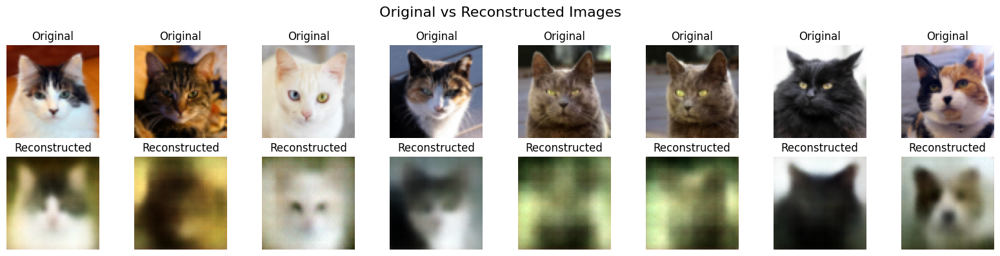

In [36]:
data_iter = iter(val_loader)
images, _ = next(data_iter)
visualize_reconstructions(model, images, device)

#### <font color='red'>7. Model with kl_weight=10</font>

In [37]:
# Model training parameters
learning_rate=0.0001
step_size=10
gamma=0.5

kl_weight=10

num_epochs=40

latent_dim = 512 # define latent dimension

name=f"run_kl_wgt_{str(kl_weight)}_ep_{num_epochs}_latent_dim_{latent_dim}"
project="assignment-5-v2"


# Load model
model = ConvVAE(latent_dim=latent_dim).to(device)
# model

model = run_vae_training(
    model, train_loader, val_loader, device, 
    num_epochs=num_epochs, learning_rate=learning_rate,
    step_size=step_size, gamma=gamma,
    kl_weight=kl_weight,
    name=name, project=project
)

save_path = os.path.join(saved_model_folder, name)
torch.save(model, save_path)
print(f"Model saved at: {save_path}")

Training Name: run_kl_wgt_10_ep_40_latent_dim_512
Total num. of Epochs: 40
Learning Rate: 0.0001
KL Weight used for Loss function: 10



  2%|█▍                                                      | 1/40 [00:09<05:55,  9.13s/it]


Epoch 1/40
Learning Rate: 0.000100
Train - Total: 2157.0848, Recon: 1825.2464, KL: 33.1838
Eval  - Total: 6552.8518, Recon: 6189.9753, KL: 36.2876


  5%|██▊                                                     | 2/40 [00:18<05:52,  9.27s/it]


Epoch 2/40
Learning Rate: 0.000100
Train - Total: 1755.9227, Recon: 1419.9669, KL: 33.5956
Eval  - Total: 5520.5934, Recon: 5141.5175, KL: 37.9076


  8%|████▏                                                   | 3/40 [00:27<05:43,  9.28s/it]


Epoch 3/40
Learning Rate: 0.000100
Train - Total: 1693.6546, Recon: 1358.3253, KL: 33.5329
Eval  - Total: 4729.6289, Recon: 4400.4534, KL: 32.9175


 10%|█████▌                                                  | 4/40 [00:36<05:31,  9.21s/it]


Epoch 4/40
Learning Rate: 0.000100
Train - Total: 1644.8664, Recon: 1309.4471, KL: 33.5419
Eval  - Total: 3248.0873, Recon: 2969.4295, KL: 27.8658


 12%|███████                                                 | 5/40 [00:46<05:24,  9.26s/it]


Epoch 5/40
Learning Rate: 0.000100
Train - Total: 1575.8642, Recon: 1245.7547, KL: 33.0110
Eval  - Total: 2567.7009, Recon: 2301.9752, KL: 26.5726


 15%|████████▍                                               | 6/40 [00:55<05:12,  9.20s/it]


Epoch 6/40
Learning Rate: 0.000100
Train - Total: 1488.3753, Recon: 1171.3946, KL: 31.6981
Eval  - Total: 1931.7383, Recon: 1645.7995, KL: 28.5939


 18%|█████████▊                                              | 7/40 [01:04<05:02,  9.17s/it]


Epoch 7/40
Learning Rate: 0.000100
Train - Total: 1440.0781, Recon: 1129.6804, KL: 31.0398
Eval  - Total: 1707.5855, Recon: 1417.6625, KL: 28.9923


 20%|███████████▏                                            | 8/40 [01:13<04:54,  9.22s/it]


Epoch 8/40
Learning Rate: 0.000100
Train - Total: 1405.7730, Recon: 1097.8238, KL: 30.7949
Eval  - Total: 1538.0931, Recon: 1248.5845, KL: 28.9509


 22%|████████████▌                                           | 9/40 [01:22<04:45,  9.21s/it]


Epoch 9/40
Learning Rate: 0.000100
Train - Total: 1382.4061, Recon: 1077.1331, KL: 30.5273
Eval  - Total: 1558.7151, Recon: 1285.9892, KL: 27.2726


 25%|█████████████▊                                         | 10/40 [01:32<04:35,  9.17s/it]


Epoch 10/40
Learning Rate: 0.000100
Train - Total: 1366.6022, Recon: 1062.3147, KL: 30.4288
Eval  - Total: 1494.0938, Recon: 1240.4029, KL: 25.3691


 28%|███████████████▏                                       | 11/40 [01:41<04:25,  9.17s/it]


Epoch 11/40
Learning Rate: 0.000050
Train - Total: 1328.4432, Recon: 1036.3159, KL: 29.2127
Eval  - Total: 1389.7920, Recon: 1129.3528, KL: 26.0439


 30%|████████████████▌                                      | 12/40 [01:50<04:16,  9.16s/it]


Epoch 12/40
Learning Rate: 0.000050
Train - Total: 1319.7161, Recon: 1028.0504, KL: 29.1666
Eval  - Total: 1400.1831, Recon: 1130.4603, KL: 26.9723


 32%|█████████████████▉                                     | 13/40 [01:59<04:07,  9.15s/it]


Epoch 13/40
Learning Rate: 0.000050
Train - Total: 1315.7016, Recon: 1023.8647, KL: 29.1837
Eval  - Total: 1381.4048, Recon: 1118.0595, KL: 26.3345


 35%|███████████████████▎                                   | 14/40 [02:08<03:58,  9.18s/it]


Epoch 14/40
Learning Rate: 0.000050
Train - Total: 1310.0474, Recon: 1015.8295, KL: 29.4218
Eval  - Total: 1372.6176, Recon: 1098.6078, KL: 27.4010


 38%|████████████████████▋                                  | 15/40 [02:17<03:49,  9.17s/it]


Epoch 15/40
Learning Rate: 0.000050
Train - Total: 1309.3526, Recon: 1015.0413, KL: 29.4311
Eval  - Total: 1351.2766, Recon: 1078.8070, KL: 27.2470


 40%|██████████████████████                                 | 16/40 [02:27<03:40,  9.18s/it]


Epoch 16/40
Learning Rate: 0.000050
Train - Total: 1304.1634, Recon: 1009.0602, KL: 29.5103
Eval  - Total: 1297.5114, Recon: 1014.9974, KL: 28.2514


 42%|███████████████████████▍                               | 17/40 [02:36<03:31,  9.17s/it]


Epoch 17/40
Learning Rate: 0.000050
Train - Total: 1302.0690, Recon: 1005.8914, KL: 29.6178
Eval  - Total: 1299.0932, Recon: 1023.3549, KL: 27.5738


 45%|████████████████████████▊                              | 18/40 [02:45<03:22,  9.20s/it]


Epoch 18/40
Learning Rate: 0.000050
Train - Total: 1298.3275, Recon: 1002.3036, KL: 29.6024
Eval  - Total: 1259.9567, Recon: 980.4460, KL: 27.9511


 48%|██████████████████████████▏                            | 19/40 [02:54<03:12,  9.17s/it]


Epoch 19/40
Learning Rate: 0.000050
Train - Total: 1296.9018, Recon: 998.8204, KL: 29.8081
Eval  - Total: 1211.8236, Recon: 944.5828, KL: 26.7241


 50%|███████████████████████████▌                           | 20/40 [03:03<03:03,  9.19s/it]


Epoch 20/40
Learning Rate: 0.000050
Train - Total: 1292.5842, Recon: 993.9331, KL: 29.8651
Eval  - Total: 1324.4612, Recon: 1040.3206, KL: 28.4141


 52%|████████████████████████████▉                          | 21/40 [03:12<02:54,  9.17s/it]


Epoch 21/40
Learning Rate: 0.000025
Train - Total: 1274.1564, Recon: 982.1062, KL: 29.2050
Eval  - Total: 1235.8722, Recon: 963.0801, KL: 27.2792


 55%|██████████████████████████████▎                        | 22/40 [03:22<02:46,  9.24s/it]


Epoch 22/40
Learning Rate: 0.000025
Train - Total: 1269.6593, Recon: 976.0304, KL: 29.3629
Eval  - Total: 1225.3703, Recon: 952.2869, KL: 27.3083


 57%|███████████████████████████████▌                       | 23/40 [03:31<02:36,  9.22s/it]


Epoch 23/40
Learning Rate: 0.000025
Train - Total: 1267.4736, Recon: 973.8346, KL: 29.3639
Eval  - Total: 1228.8226, Recon: 951.5217, KL: 27.7301


 60%|█████████████████████████████████                      | 24/40 [03:40<02:27,  9.20s/it]


Epoch 24/40
Learning Rate: 0.000025
Train - Total: 1266.0500, Recon: 971.2634, KL: 29.4787
Eval  - Total: 1236.9063, Recon: 964.0563, KL: 27.2850


 62%|██████████████████████████████████▍                    | 25/40 [03:49<02:17,  9.17s/it]


Epoch 25/40
Learning Rate: 0.000025
Train - Total: 1262.4267, Recon: 967.5417, KL: 29.4885
Eval  - Total: 1206.9571, Recon: 930.3641, KL: 27.6593


 65%|███████████████████████████████████▊                   | 26/40 [03:59<02:08,  9.20s/it]


Epoch 26/40
Learning Rate: 0.000025
Train - Total: 1260.0572, Recon: 964.8009, KL: 29.5256
Eval  - Total: 1207.8776, Recon: 929.3955, KL: 27.8482


 68%|█████████████████████████████████████▏                 | 27/40 [04:08<01:59,  9.17s/it]


Epoch 27/40
Learning Rate: 0.000025
Train - Total: 1258.4800, Recon: 963.1879, KL: 29.5292
Eval  - Total: 1203.3589, Recon: 921.3342, KL: 28.2025


 70%|██████████████████████████████████████▌                | 28/40 [04:17<01:49,  9.16s/it]


Epoch 28/40
Learning Rate: 0.000025
Train - Total: 1255.7984, Recon: 959.5883, KL: 29.6210
Eval  - Total: 1196.2541, Recon: 915.3641, KL: 28.0890


 72%|███████████████████████████████████████▉               | 29/40 [04:26<01:40,  9.17s/it]


Epoch 29/40
Learning Rate: 0.000025
Train - Total: 1251.8993, Recon: 956.2734, KL: 29.5626
Eval  - Total: 1216.7488, Recon: 939.3323, KL: 27.7416


 75%|█████████████████████████████████████████▎             | 30/40 [04:35<01:31,  9.18s/it]


Epoch 30/40
Learning Rate: 0.000025
Train - Total: 1251.9917, Recon: 955.5270, KL: 29.6465
Eval  - Total: 1169.0636, Recon: 895.1769, KL: 27.3887


 78%|██████████████████████████████████████████▋            | 31/40 [04:44<01:22,  9.18s/it]


Epoch 31/40
Learning Rate: 0.000013
Train - Total: 1243.2036, Recon: 949.7775, KL: 29.3426
Eval  - Total: 1196.1422, Recon: 920.2437, KL: 27.5899


 80%|████████████████████████████████████████████           | 32/40 [04:53<01:13,  9.16s/it]


Epoch 32/40
Learning Rate: 0.000013
Train - Total: 1239.7660, Recon: 945.2933, KL: 29.4473
Eval  - Total: 1171.4383, Recon: 898.9414, KL: 27.2497


 82%|█████████████████████████████████████████████▍         | 33/40 [05:03<01:04,  9.17s/it]


Epoch 33/40
Learning Rate: 0.000013
Train - Total: 1241.6101, Recon: 948.1848, KL: 29.3425
Eval  - Total: 1188.4546, Recon: 911.0868, KL: 27.7368


 85%|██████████████████████████████████████████████▊        | 34/40 [05:12<00:54,  9.14s/it]


Epoch 34/40
Learning Rate: 0.000013
Train - Total: 1237.6491, Recon: 942.7972, KL: 29.4852
Eval  - Total: 1170.6218, Recon: 887.0989, KL: 28.3523


 88%|████████████████████████████████████████████████▏      | 35/40 [05:21<00:45,  9.14s/it]


Epoch 35/40
Learning Rate: 0.000013
Train - Total: 1239.3901, Recon: 943.7475, KL: 29.5643
Eval  - Total: 1182.4004, Recon: 904.4201, KL: 27.7980


 90%|█████████████████████████████████████████████████▌     | 36/40 [05:30<00:36,  9.15s/it]


Epoch 36/40
Learning Rate: 0.000013
Train - Total: 1238.1594, Recon: 943.6357, KL: 29.4524
Eval  - Total: 1176.3029, Recon: 894.0215, KL: 28.2281


 92%|██████████████████████████████████████████████████▉    | 37/40 [05:39<00:27,  9.17s/it]


Epoch 37/40
Learning Rate: 0.000013
Train - Total: 1235.0282, Recon: 940.2907, KL: 29.4738
Eval  - Total: 1169.4251, Recon: 894.2249, KL: 27.5200


 95%|████████████████████████████████████████████████████▎  | 38/40 [05:48<00:18,  9.18s/it]


Epoch 38/40
Learning Rate: 0.000013
Train - Total: 1233.6045, Recon: 938.5580, KL: 29.5046
Eval  - Total: 1165.9842, Recon: 890.6818, KL: 27.5302


 98%|█████████████████████████████████████████████████████▋ | 39/40 [05:58<00:09,  9.14s/it]


Epoch 39/40
Learning Rate: 0.000013
Train - Total: 1233.6715, Recon: 939.0915, KL: 29.4580
Eval  - Total: 1162.5105, Recon: 889.6438, KL: 27.2867


100%|███████████████████████████████████████████████████████| 40/40 [06:07<00:00,  9.18s/it]


Epoch 40/40
Learning Rate: 0.000013
Train - Total: 1232.8376, Recon: 937.3699, KL: 29.5468
Eval  - Total: 1159.3661, Recon: 885.7482, KL: 27.3618


epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
learning_rate,██████████▄▄▄▄▄▄▄▄▄▄▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁
train/kl_loss,▇███▇▅▄▄▃▃▁▁▁▁▁▂▂▂▂▂▁▁▁▁▂▂▂▂▂▂▁▁▁▂▂▁▁▂▁▂
train/recon_loss,█▅▄▄▃▃▃▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/total_loss,█▅▄▄▄▃▃▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val/kl_loss,▇█▅▂▂▃▃▃▂▁▁▂▂▂▂▃▂▂▂▃▂▂▂▂▂▂▃▃▂▂▂▂▂▃▂▃▂▂▂▂
val/recon_loss,█▇▆▄▃▂▂▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val/total_loss,█▇▆▄▃▂▂▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,40
learning_rate,1e-05
train/kl_loss,29.54678


Model saved at: ./saved_models/run_kl_wgt_10_ep_40_latent_dim_512


In [38]:
model = load_model(save_path)
max_samples = min(2000, len(val_loader.dataset))
fid_score = compute_fid_score(model, val_loader, device, max_samples=max_samples)
print(f"FID Score for model {name}: {fid_score}")

/tmp/ipykernel_1886659/2494337095.py:5: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load(model_path)


FID Score for model run_kl_wgt_10_ep_40_latent_dim_512: 186.1881561279297


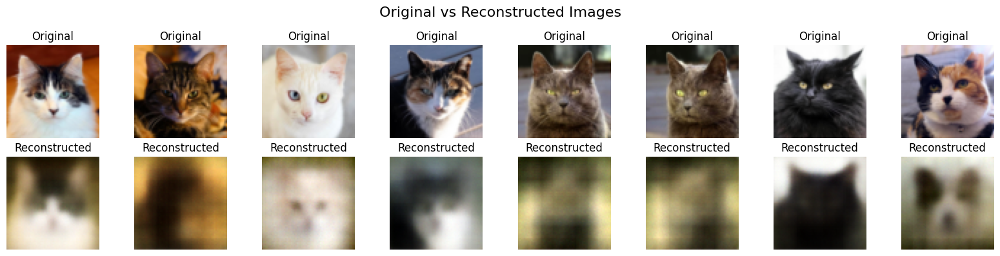

In [39]:
data_iter = iter(val_loader)
images, _ = next(data_iter)
visualize_reconstructions(model, images, device)

### Latent Space and Image TSNE Projection

In [48]:
def visualize_latent_space_tsne(model, dataloader, num_samples=2000, device="cuda" if torch.cuda.is_available() else "cpu"):
    """
    Visualize latent space by encoding images and projecting latent representations using T-SNE.
    """
    model.eval()
    latents = []
    labels = []

    with torch.no_grad():
        for i, (img_batch, label_batch) in enumerate(dataloader):
            if len(latents) >= num_samples:
                break
            img_batch = img_batch.to(device)
            mu, _ = model.encoder(img_batch)
            latents.append(mu.cpu().numpy())
            labels.extend(label_batch.cpu().numpy())
    
    # Flatten for TSNE visualization
    latents = np.concatenate(latents)[:num_samples]
    labels = np.array(labels)[:num_samples]

    # Apply T-SNE
    tsne_latents = TSNE(n_components=2).fit_transform(latents)

    # Plot the projection
    plt.figure(figsize=(8, 6))
    scatter = plt.scatter(tsne_latents[:, 0], tsne_latents[:, 1], c=labels, cmap='viridis', alpha=0.5)
    plt.title("T-SNE Projection of Latent Representations")
    plt.xlabel("T-SNE Component 1")
    plt.ylabel("T-SNE Component 2")
    
    plt.legend(handles=scatter.legend_elements()[0], labels=['cat', 'dog', 'wild'], title="Classes")
    plt.show()

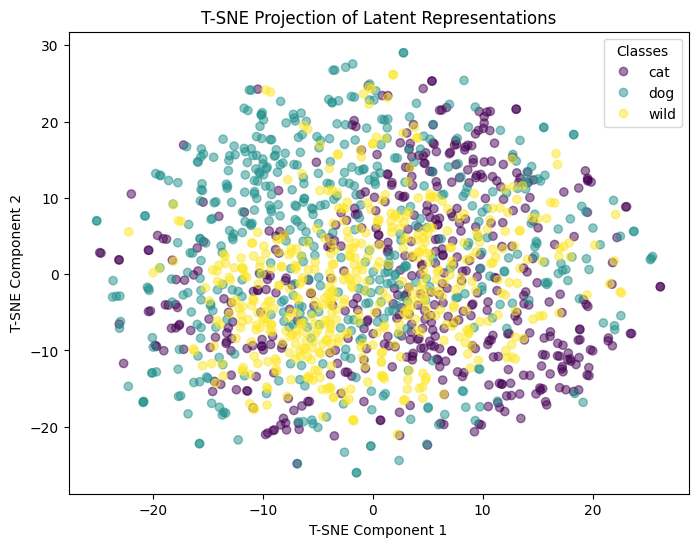

In [49]:
# model used here is with kl_weight=10
visualize_latent_space_tsne(model, val_loader)

In [57]:
def visualize_image_tsne(model, dataloader, num_samples=2000, device="cuda" if torch.cuda.is_available() else "cpu"):
    """
    Visualize images by projecting image pixel data using T-SNE.
    """
    model.eval()
    images = []
    labels = []

    with torch.no_grad():
        for i, (img_batch, label_batch) in enumerate(dataloader):
            if len(images) >= num_samples:
                break
            images.append(img_batch.numpy())
            labels.extend(label_batch.numpy())

    images = np.concatenate(images)[:num_samples]
    labels = np.array(labels)[:num_samples]

    # Flatten for TSNE visualization
    images_flat = images.reshape(images.shape[0], -1)

    # Apply T-SNE
    tsne_imgs = TSNE(n_components=2).fit_transform(images_flat)

    # Plot the projection
    plt.figure(figsize=(8, 6))
    scatter = plt.scatter(tsne_imgs[:, 0], tsne_imgs[:, 1], c=labels, cmap='viridis', alpha=0.5)
    plt.title("T-SNE Projection of Images")
    plt.xlabel("T-SNE Component 1")
    plt.ylabel("T-SNE Component 2")
    
    plt.legend(handles=scatter.legend_elements()[0], labels=['cat', 'dog', 'wild'], title="Classes")
    
    plt.show()

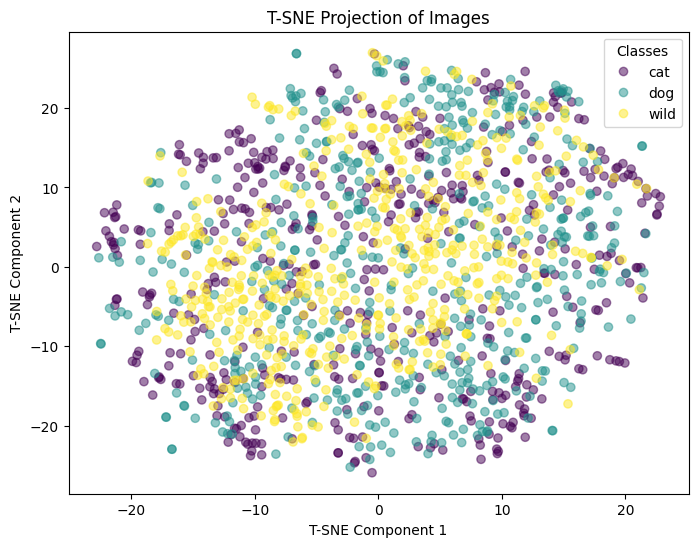

In [58]:
# model used here is with kl_weight=10
visualize_image_tsne(model, val_loader)

### Generating new images from latent dimension

In [59]:
def generate_images(model, latent_dim, num_images, device):
    """
    Generate new images by sampling latent vectors and decoding them with the VAE model.
    """
    model.eval()
    with torch.no_grad():
        # Sample random latent vectors
        z = torch.randn(num_images, latent_dim).to(device)
        generated_images = model.decoder(z)
    return generated_images

### Latent Space Interpolation

In [76]:
def visualize_latent_interpolation_grid(model, latent_dim, num_steps, device):
    """
    Visualize interpolations in the latent space between four random points as a grid.
    """
    model.eval()
    with torch.no_grad():
        # Sample four random latent vectors
        z1 = torch.randn(1, latent_dim).to(device)
        z2 = torch.randn(1, latent_dim).to(device)
        z3 = torch.randn(1, latent_dim).to(device)
        z4 = torch.randn(1, latent_dim).to(device)

        # Interpolation weights
        weights = torch.linspace(0, 1, num_steps).to(device)

        
        grid_images = []
        for alpha in weights:
            row = []
            for beta in weights:
                # Bilinear interpolation
                z = (1 - alpha) * (1 - beta) * z1 + \
                    (1 - alpha) * beta * z2 + \
                    alpha * (1 - beta) * z3 + \
                    alpha * beta * z4
                row.append(model.decoder(z))
            grid_images.append(torch.cat(row, dim=0))

        # Concatenate rows to form the grid
        grid_images = torch.cat(grid_images, dim=0)
        

        grid_images = (grid_images * 0.5 + 0.5).cpu()
        grid = make_grid(grid_images, nrow=num_steps, normalize=True, pad_value=1)

        # Plot the grid
        plt.figure(figsize=(15, 15))
        plt.imshow(grid.permute(1, 2, 0))
        plt.axis('off')
        plt.title("Latent Space Interpolation")
        plt.show()


#### For model with kl_weight=10

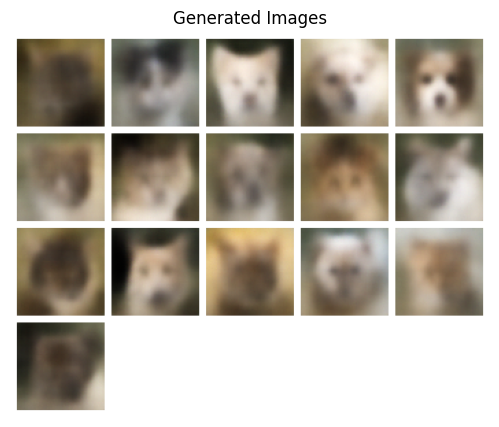

In [77]:
num_images = 16
latent_dim = 512  # Adjust based on your model
generated_images = generate_images(model, latent_dim, num_images, device).to("cpu")

# Visualize generated images
grid = make_grid(generated_images * 0.5 + 0.5, nrow=5, normalize=True, pad_value=1, padding=5)
plt.figure(figsize=(10, 5))
plt.imshow(grid.permute(1, 2, 0))
plt.axis('off')
plt.title("Generated Images")
plt.show()

#### For model with kl_weight=10

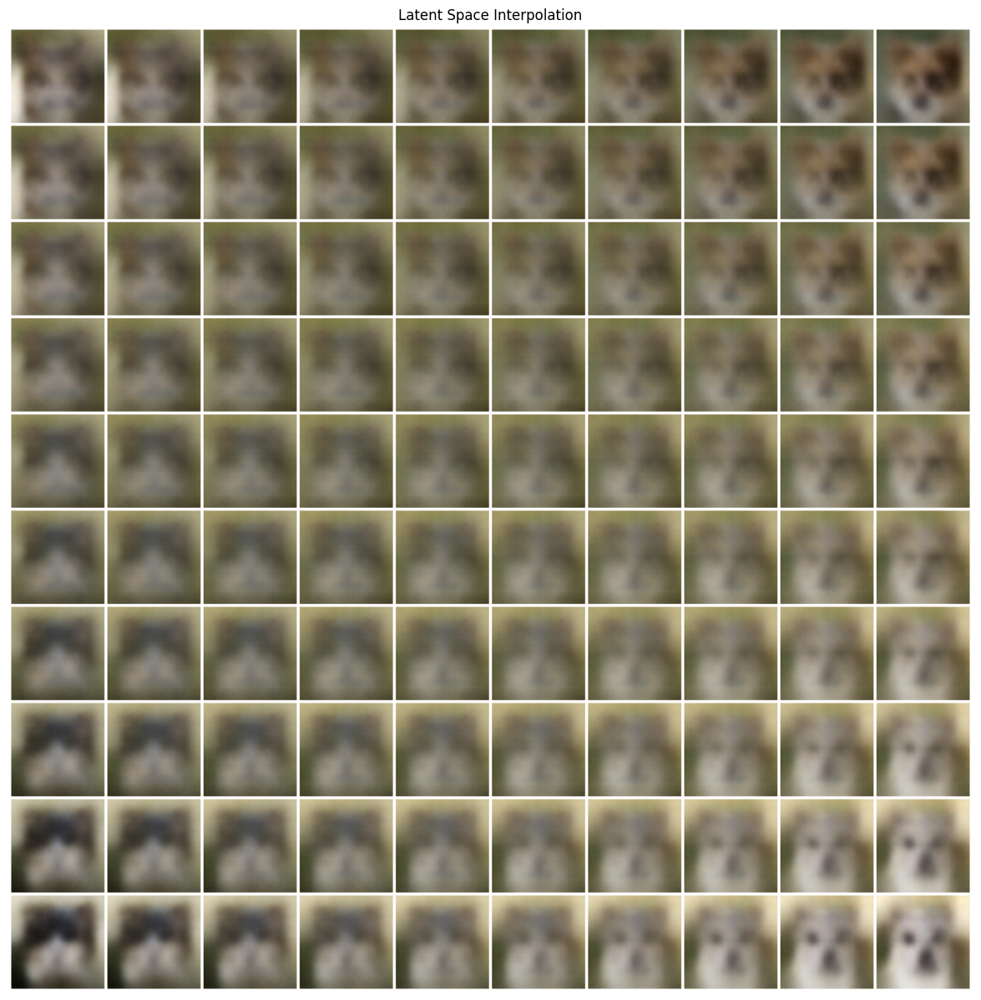

In [78]:
num_steps = 10  # Number of interpolation steps
visualize_latent_interpolation_grid(model, latent_dim, num_steps, device)

#### For model with kl_weight=0.1

/tmp/ipykernel_1886659/2494337095.py:5: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load(model_path)


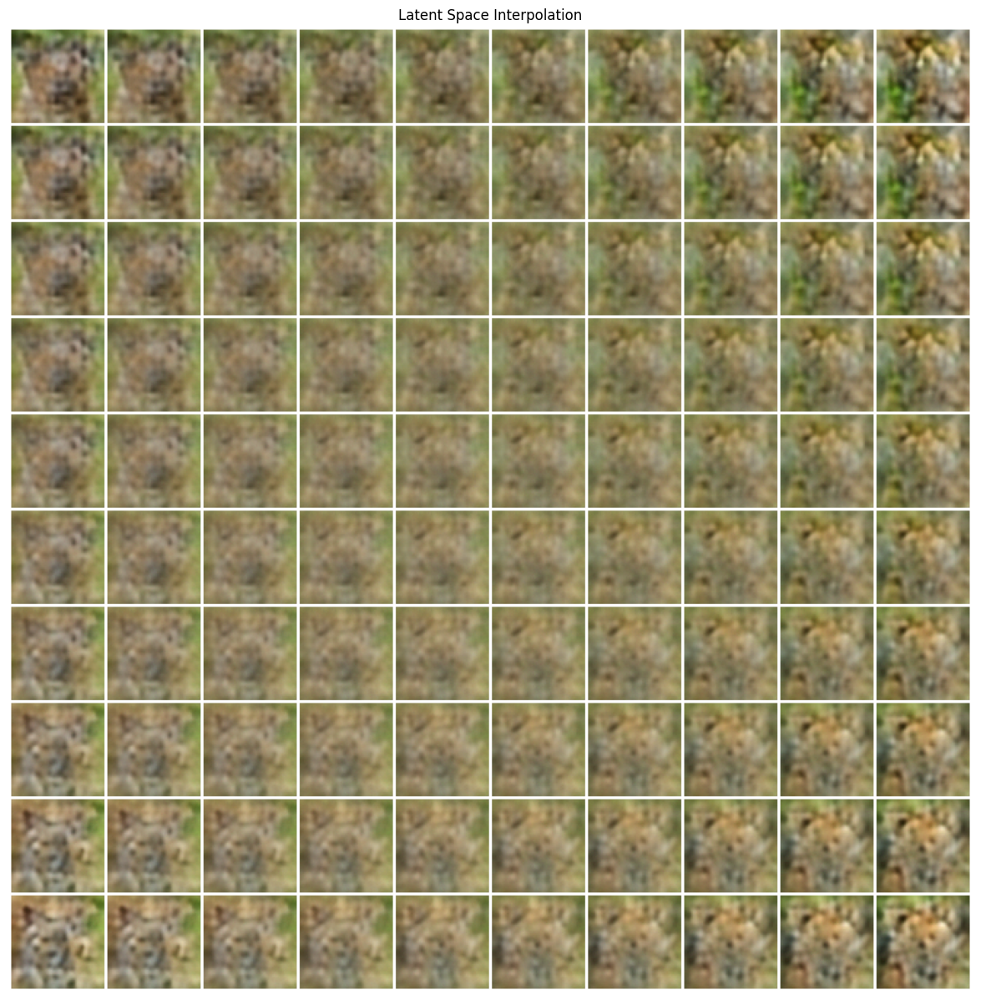

In [79]:
num_steps = 10  # Number of interpolation steps
model = load_model("./saved_models/run_kl_wgt_0.1_ep_40_latent_dim_512")
visualize_latent_interpolation_grid(model, latent_dim, num_steps, device)

/tmp/ipykernel_1886659/2494337095.py:5: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load(model_path)


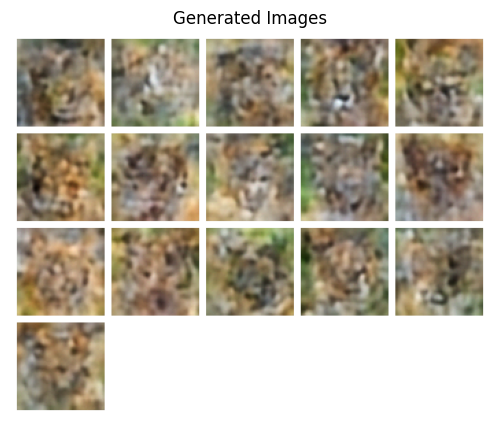

In [98]:
model = load_model("./saved_models/run_kl_wgt_0.1_ep_40_latent_dim_512")
num_images = 16
latent_dim = 512  # Adjust based on your model
generated_images = generate_images(model, latent_dim, num_images, device).to("cpu")

# Visualize generated images
grid = make_grid(generated_images * 0.5 + 0.5, nrow=5, normalize=True, pad_value=1, padding=5)
plt.figure(figsize=(10, 5))
plt.imshow(grid.permute(1, 2, 0))
plt.axis('off')
plt.title("Generated Images")
plt.show()

### Interpolation between 2 images

In [95]:
def interpolate_latent(model, dataloader, num_steps=8, device="cuda"):
    """
    Interpolate between two random images in the latent space and visualize the interpolation.
    """
    model.eval()
    
    # Randomly pick two images
    batch_size = 2 
    idx = torch.randint(0, len(dataloader.dataset), (batch_size,))  # Random indices
    images = [dataloader.dataset[i][0] for i in idx]  # Fetch images 
    img1, img2 = images[0].to(device), images[1].to(device) 
    
    with torch.no_grad():
        # Encode the two randomly chosen images
        mu1, log_var1 = model.encoder(img1.unsqueeze(0))
        mu2, log_var2 = model.encoder(img2.unsqueeze(0))
        
        # Generate interpolation steps
        alphas = np.linspace(0, 1, num_steps)
        interp_images = []
        
        for alpha in alphas:
            # Perform linear interpolation in latent space
            z = mu1 * (1 - alpha) + mu2 * alpha
            decoded = model.decoder(z)
            interp_images.append(decoded)
        
        # Concatenate the interpolated images
        interp_images = torch.cat(interp_images).cpu().permute(0, 2, 3, 1).numpy()
        interp_images = (interp_images + 1) / 2 
        
        # Plot the interpolated images
        plt.figure(figsize=(2 * num_steps, 2))
        for i in range(num_steps):
            plt.subplot(1, num_steps, i + 1)
            plt.imshow(np.clip(interp_images[i], 0, 1))
            plt.axis('off')
        plt.show()

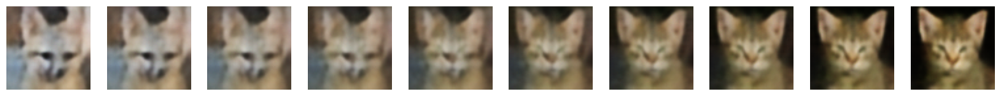

In [96]:
interpolate_latent(model, val_loader, num_steps=10)

/tmp/ipykernel_1886659/2494337095.py:5: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load(model_path)


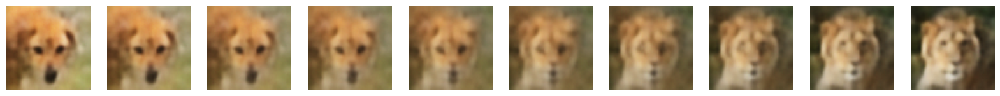

In [97]:
model = load_model("./saved_models/run_kl_wgt_0.1_ep_40_latent_dim_512")
interpolate_latent(model, val_loader, num_steps=10)

### Analysis of the trained models

##### <font color='red'>FID scores of models</font>

| **Model**                                      | **FID Score**   |
|------------------------------------------------|-----------------|
| run_kl_wgt_1_ep_40_latent_dim_512             | 147.12          |
| run_kl_wgt_0.1_ep_40_latent_dim_512           | 122.67          |
| run_kl_wgt_0.01_ep_40_latent_dim_512          | 116.99          |
| run_kl_wgt_0.001_ep_40_latent_dim_512         | 116.67          |
| run_kl_wgt_1.5_ep_40_latent_dim_512           | 157.55          |
| run_kl_wgt_2_ep_40_latent_dim_512             | 162.39          |
| run_kl_wgt_5_ep_40_latent_dim_512             | 179.61          |
| run_kl_wgt_10_ep_40_latent_dim_512            | 186.19          |


The FID score measures how similar generated images are to real images. A lower FID score means the generated images look more like real ones, and a higher score means they are less similar. Looking at FID scores with different kl weights in the model we see a trend that lower the kl divergence weights, the better the FID scores are.

##### <font color='red'>Qualitative Comparison</font>

While looking at the images generated by the 8 models, we see that models with lower kl divergence weights(0.1 - 0.001) produce more clear reconstructed images. As we lower the kl_weight we see that images become more sharp in their features but there a certain level of bluriness (not smoothness) in the images. Models with kl_divergence weights in the range of 1-10 get more smoothed out and loose details as we increase the kl_weight. At kl_weight=10, they almost become indistinguishable and it can't be figured out what animal it is from the reconstructed images

Both  FID scores and qualitative comparison show the same trend that lower kl_weight produces better images than higher kl_weights

The image quality can be further imporved by introducing skip connections in the model

##### <font color='red'>Loss Analysis</font>

In each model the overall and reconstruction loss decreases wile the kl divergence loss increases for the first few epochs and then remains nearly the same for the rest of training.

This behaviour can be interpreted as follows: in the early epochs, the model focuses on improving reconstruction loss, the kl divergence loss because the latent space is not well structured but increases as the model starts to match the prior distribution. In the later epochs the model continues improving reconstruction loss, the kl divergence loss stabilizes as the latent space is now better aligned with the prior distribution.

When the KL divergence weight is high (e.g. 10), the latent space is more regularized, which means that the latent variables of the model are forced to follow a more structured distribution. More regularized latent space results in smoother transitions between images when interpolating between latent points.

With a more regularized latent space, the model is less likely to generate unrealistic or out-of-distribution samples.

In conclusion, although a kl weight = 0.1 may lead to more visually realistic images with lower FID scores in certain contexts, kl weight = 10 can outperform it when the goal is to generate smooth, continuous samples.

The latent representations (TSNE) for different classes seem to overlap significantly. This shows that the latent space does not fully separate the classes, which can make it harder for the decoder to generate meaningful samples for unseen latent vectors. We also see this effect when generating new samples, although the samples generated using kl_weight=10 are better than those with kl_weight=0.1, the images are still highly smoothed/undistinguishable in many cases . This can be due to insufficient latent dimension or the decoder is not able to generalize well to latent points in the overlapping regions.